# Freesound Audio Taggin 2019 - Solution Part 1


This is based upon 
- https://www.kaggle.com/daisukelab/cnn-2d-basic-solution-powered-by-fast-ai.
- Based on the 2nd version. https://www.kaggle.com/daisukelab/clf-to-multi-cnn-2d-basic-2-preprocessed-dataset
- Borrowing model from https://www.kaggle.com/mhiro2/simple-2d-cnn-classifier-with-pytorch
- Using preprocessed dataset. https://www.kaggle.com/daisukelab/fat2019_prep_mels1

Please read README.md for more information like SpecMix...

In [1]:
import os
from pathlib import Path
import pickle
import random
import warnings

import numpy as np
import pandas as pd
from scipy.stats import rankdata
from sklearn.model_selection import KFold
import librosa
import librosa.display
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
import IPython
import IPython.display
import PIL
import seaborn as sns

import torch
import torch.nn as nn
import torch.nn.functional as F

from fastai import *
from fastai.vision import *
from fastai.vision.data import *
from fastai.callbacks import *

In [2]:
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

SEED = 2019
seed_everything(SEED)

In [3]:
TOY_MODE = False
TTA_SHIFT = 32  # TTA: predict every TTA_SHIFT
bs=128
n_splits = 10

In [4]:
DATA = Path('../input')
PREPROCESSED = Path('/media/eric/Data/freesound-audio-tagging-2019/preprocessed')
WORK = Path('work')
Path(WORK).mkdir(exist_ok=True, parents=True)
Path(PREPROCESSED).mkdir(exist_ok=True, parents=True)

CSV_TRN_CURATED = DATA/'train_curated.csv'
CSV_TRN_NOISY = DATA/'train_noisy.csv'
CSV_SUBMISSION = DATA/'sample_submission.csv'

MELS_TRN_CURATED = PREPROCESSED/'mels_train_curated.pkl'
MELS_TRN_NOISY = PREPROCESSED/'mels_train_noisy.pkl'
MELS_TEST = PREPROCESSED/'mels_test.pkl'

DATA_CURATED = DATA/'train_curated'
DATA_NOISY = DATA/'train_noisy'
DATA_TEST = DATA/'test'

trn_curated_df = pd.read_csv(CSV_TRN_CURATED)
trn_noisy_df = pd.read_csv(CSV_TRN_NOISY)
test_df = pd.read_csv(CSV_SUBMISSION)

In [83]:
# # Drop samples with incorrect label
# # Discussion from organizers: https://www.kaggle.com/c/freesound-audio-tagging-2019/discussion/93480
useless = ['f76181c4.wav', '77b925c2.wav', '6a1f682a.wav', 'c7db12aa.wav', '7752cc8a.wav', '1d44b0bd.wav']
# trn_curated_df = trn_curated_df[~trn_curated_df.fname.isin(useless)]

### Audio conversion to 2D

Almost copyed from my repository: https://github.com/daisukelab/ml-sound-classifier

    Handle sampling rate 44.1kHz as is, no information loss.
    Size of each file will be 128 x L, L is audio seconds x 128; [128, 256] if sound is 2s long.
    Convert to Mel-spectrogram, not MFCC. We are handling general sound rather than human voice. https://en.wikipedia.org/wiki/Spectrogram



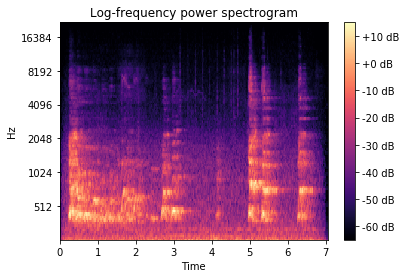

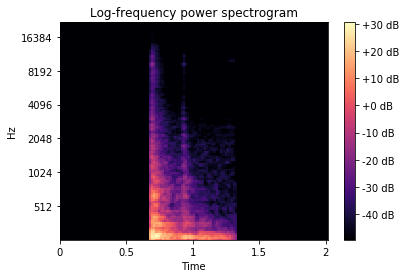

In [6]:
def read_audio(conf, pathname, trim_long_data):
    y, sr = librosa.load(pathname, sr=conf.sampling_rate)
    # trim silence
    if 0 < len(y): # workaround: 0 length causes error
        y, _ = librosa.effects.trim(y) # trim, top_db=default(60)
    # make it unified length to conf.samples
    if len(y) > conf.samples: # long enough
        if trim_long_data:
            y = y[0:0+conf.samples]
    else: # pad blank
        padding = conf.samples - len(y)    # add padding at both ends
        offset = padding // 2
        y = np.pad(y, (offset, conf.samples - len(y) - offset), 'constant')
    return y

def audio_to_melspectrogram(conf, audio):
    spectrogram = librosa.feature.melspectrogram(audio, 
                                                 sr=conf.sampling_rate,
                                                 n_mels=conf.n_mels,
                                                 hop_length=conf.hop_length,
                                                 n_fft=conf.n_fft,
                                                 fmin=conf.fmin,
                                                 fmax=conf.fmax)
    spectrogram = librosa.power_to_db(spectrogram)
    spectrogram = spectrogram.astype(np.float32)
    return spectrogram

def show_melspectrogram(conf, mels, title='Log-frequency power spectrogram'):
    librosa.display.specshow(mels, x_axis='time', y_axis='mel', 
                             sr=conf.sampling_rate, hop_length=conf.hop_length,
                            fmin=conf.fmin, fmax=conf.fmax)
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.show()

def read_as_melspectrogram(conf, pathname, trim_long_data, debug_display=False):
    x = read_audio(conf, pathname, trim_long_data)
    mels = audio_to_melspectrogram(conf, x)
    if debug_display:
        IPython.display.display(IPython.display.Audio(x, rate=conf.sampling_rate))
        show_melspectrogram(conf, mels)
    return mels


class conf:
    # Preprocessing settings
    sampling_rate = 44100
    duration = 2
    hop_length = 347*duration # to make time steps 128
    fmin = 20
    fmax = sampling_rate // 2
    n_mels = 128
    n_fft = n_mels * 20
    samples = sampling_rate * duration


# example
x = read_as_melspectrogram(conf, DATA_CURATED/'0006ae4e.wav', trim_long_data=False, debug_display=True)
x = read_as_melspectrogram(conf, DATA_CURATED/'05e4ad19.wav', trim_long_data=False, debug_display=True)

### Making 2D mel-spectrogram data as 2D 3ch images

So that normal CNN image classifier can handle.

In [7]:
def mono_to_color(X, mean=None, std=None, norm_max=None, norm_min=None, eps=1e-6):
    # Stack X as [X,X,X]
    X = np.stack([X, X, X], axis=-1)

    # Standardize
    mean = mean or X.mean()
    std = std or X.std()
    Xstd = (X - mean) / (std + eps)
    _min, _max = Xstd.min(), Xstd.max()
    norm_max = norm_max or _max
    norm_min = norm_min or _min
    if (_max - _min) > eps:
        # Scale to [0, 255]
        V = Xstd
        V[V < norm_min] = norm_min
        V[V > norm_max] = norm_max
        V = 255 * (V - norm_min) / (norm_max - norm_min)
        V = V.astype(np.uint8)
    else:
        # Just zero
        V = np.zeros_like(Xstd, dtype=np.uint8)
    return V

def convert_wav_to_image(df, source, img_dest):
    print(f'Converting {source} -> {img_dest}')
    X = []
    for i, row in tqdm_notebook(df.iterrows(), total=df.shape[0]):
        x = read_as_melspectrogram(conf, source/str(row.fname), trim_long_data=False)
        x_color = mono_to_color(x)
        X.append(x_color)
    pickle.dump(X, open(img_dest, 'wb'))
    return X

In [8]:
if not MELS_TRN_CURATED.is_file():
    convert_wav_to_image(trn_curated_df, source=DATA_CURATED, img_dest=MELS_TRN_CURATED)   

if not MELS_TRN_NOISY.is_file():
    convert_wav_to_image(trn_noisy_df, source=DATA_NOISY, img_dest=MELS_TRN_NOISY)   

if not MELS_TEST.is_file():
    convert_wav_to_image(test_df, source=DATA_TEST, img_dest=MELS_TEST)    

### Official Metric

In [9]:
# from official code https://colab.research.google.com/drive/1AgPdhSp7ttY18O3fEoHOQKlt_3HJDLi8#scrollTo=cRCaCIb9oguU
def _one_sample_positive_class_precisions(scores, truth):
    """Calculate precisions for each true class for a single sample.

    Args:
      scores: np.array of (num_classes,) giving the individual classifier scores.
      truth: np.array of (num_classes,) bools indicating which classes are true.

    Returns:
      pos_class_indices: np.array of indices of the true classes for this sample.
      pos_class_precisions: np.array of precisions corresponding to each of those
        classes.
    """
    num_classes = scores.shape[0]
    pos_class_indices = np.flatnonzero(truth > 0)
    # Only calculate precisions if there are some true classes.
    if not len(pos_class_indices):
        return pos_class_indices, np.zeros(0)
    # Retrieval list of classes for this sample.
    retrieved_classes = np.argsort(scores)[::-1]
    # class_rankings[top_scoring_class_index] == 0 etc.
    class_rankings = np.zeros(num_classes, dtype=np.int)
    class_rankings[retrieved_classes] = range(num_classes)
    # Which of these is a true label?
    retrieved_class_true = np.zeros(num_classes, dtype=np.bool)
    retrieved_class_true[class_rankings[pos_class_indices]] = True
    # Num hits for every truncated retrieval list.
    retrieved_cumulative_hits = np.cumsum(retrieved_class_true)
    # Precision of retrieval list truncated at each hit, in order of pos_labels.
    precision_at_hits = (
            retrieved_cumulative_hits[class_rankings[pos_class_indices]] /
            (1 + class_rankings[pos_class_indices].astype(np.float)))
    return pos_class_indices, precision_at_hits


def calculate_per_class_lwlrap(truth, scores):
    """Calculate label-weighted label-ranking average precision.

    Arguments:
      truth: np.array of (num_samples, num_classes) giving boolean ground-truth
        of presence of that class in that sample.
      scores: np.array of (num_samples, num_classes) giving the classifier-under-
        test's real-valued score for each class for each sample.

    Returns:
      per_class_lwlrap: np.array of (num_classes,) giving the lwlrap for each
        class.
      weight_per_class: np.array of (num_classes,) giving the prior of each
        class within the truth labels.  Then the overall unbalanced lwlrap is
        simply np.sum(per_class_lwlrap * weight_per_class)
    """
    assert truth.shape == scores.shape
    num_samples, num_classes = scores.shape
    # Space to store a distinct precision value for each class on each sample.
    # Only the classes that are true for each sample will be filled in.
    precisions_for_samples_by_classes = np.zeros((num_samples, num_classes))
    for sample_num in range(num_samples):
        pos_class_indices, precision_at_hits = (
            _one_sample_positive_class_precisions(scores[sample_num, :],
                                                  truth[sample_num, :]))
        precisions_for_samples_by_classes[sample_num, pos_class_indices] = (
            precision_at_hits)
    labels_per_class = np.sum(truth > 0, axis=0)
    weight_per_class = labels_per_class / float(np.sum(labels_per_class))
    # Form average of each column, i.e. all the precisions assigned to labels in
    # a particular class.
    per_class_lwlrap = (np.sum(precisions_for_samples_by_classes, axis=0) /
                        np.maximum(1, labels_per_class))
    # overall_lwlrap = simple average of all the actual per-class, per-sample precisions
    #                = np.sum(precisions_for_samples_by_classes) / np.sum(precisions_for_samples_by_classes > 0)
    #           also = weighted mean of per-class lwlraps, weighted by class label prior across samples
    #                = np.sum(per_class_lwlrap * weight_per_class)
    return per_class_lwlrap, weight_per_class


# Accumulator object version.

class lwlrap_accumulator(object):
  """Accumulate batches of test samples into per-class and overall lwlrap."""  

  def __init__(self):
    self.num_classes = 0
    self.total_num_samples = 0
  
  def accumulate_samples(self, batch_truth, batch_scores):
    """Cumulate a new batch of samples into the metric.
    
    Args:
      truth: np.array of (num_samples, num_classes) giving boolean
        ground-truth of presence of that class in that sample for this batch.
      scores: np.array of (num_samples, num_classes) giving the 
        classifier-under-test's real-valued score for each class for each
        sample.
    """
    assert batch_scores.shape == batch_truth.shape
    num_samples, num_classes = batch_truth.shape
    if not self.num_classes:
      self.num_classes = num_classes
      self._per_class_cumulative_precision = np.zeros(self.num_classes)
      self._per_class_cumulative_count = np.zeros(self.num_classes, 
                                                  dtype=np.int)
    assert num_classes == self.num_classes
    for truth, scores in zip(batch_truth, batch_scores):
      pos_class_indices, precision_at_hits = (
        _one_sample_positive_class_precisions(scores, truth))
      self._per_class_cumulative_precision[pos_class_indices] += (
        precision_at_hits)
      self._per_class_cumulative_count[pos_class_indices] += 1
    self.total_num_samples += num_samples

  def per_class_lwlrap(self):
    """Return a vector of the per-class lwlraps for the accumulated samples."""
    return (self._per_class_cumulative_precision / 
            np.maximum(1, self._per_class_cumulative_count))

  def per_class_weight(self):
    """Return a normalized weight vector for the contributions of each class."""
    return (self._per_class_cumulative_count / 
            float(np.sum(self._per_class_cumulative_count)))

  def overall_lwlrap(self):
    """Return the scalar overall lwlrap for cumulated samples."""
    return np.sum(self.per_class_lwlrap() * self.per_class_weight())


In [10]:
class Lwlrap(Callback):
    """ class to compute lwlrap during fastai training"""
    
    def on_epoch_begin(self, **kwargs):
        self.accumulator = lwlrap_accumulator()
    
    def on_batch_end(self, last_output, last_target, **kwargs):
        self.accumulator.accumulate_samples(last_target.cpu().numpy(), torch.sigmoid(last_output).cpu().numpy())
    
    def on_epoch_end(self, last_metrics, **kwargs):
        return add_metrics(last_metrics, self.accumulator.overall_lwlrap())

In [11]:
def _sliding_df(df):
    df_multi = pd.DataFrame(columns=df.columns)

    for index, row in tqdm_notebook(df.iterrows(), total=df.shape[0]):
        idx = CUR_X_FILES.index(row.fname)
        x = PIL.Image.fromarray(CUR_X[idx])
        time_dim, base_dim = x.size
        s = math.ceil((time_dim-conf.n_mels) / TTA_SHIFT) + 1

        fname = row.fname
        tmp = pd.DataFrame(columns=df.columns)
        for crop_x in [int(np.around((time_dim-conf.n_mels)*x/(s-1))) if s != 1 else 0 for x in range(s)]:
            row.fname = fname + '!' + str(crop_x)
            tmp = tmp.append(row)
        df_multi = df_multi.append(tmp)

    return df_multi.reset_index(drop=True)



def _kfold_prediction(kf, df, file_pattern):
    """ Compute prediction, thruth, index on validation set on models trained using K-Fold """
    
    overall_preds = None
    overall_thruth = None
    overall_index = None
    
    for fold, (train_index, valid_index) in enumerate(kf.split(df)):
        print(f'Fold {fold+1}/{n_splits}')

        filename = file_pattern.format(fold=fold)
        learn.load(filename)

        df_multi = _sliding_df(df.iloc[valid_index])

        src = (ImageList.from_df(df_multi, WORK)
               .split_by_idxs(df_multi.index, df_multi.index)
               .label_from_df(label_delim=',')
        )
        data = (src.transform(tfms, size=128)
                .databunch(bs=bs)
        )

        learn.data = data
        
        # Ensure we have enought data
        assert learn.data.classes == labels, set(labels) - set(learn.data.classes)

        preds, thruth = learn.get_preds(ds_type=DatasetType.Valid)

        fname = df_multi.fname.apply(lambda x: x.split('!')[0])

        preds = pd.DataFrame(preds.cpu().numpy())
        preds['fname'] = fname
        preds = preds.groupby('fname').mean().reset_index(drop=True)
        
        thruth = pd.DataFrame(thruth.cpu().numpy())
        thruth['fname'] = fname
        thruth = thruth.groupby('fname').mean().reset_index(drop=True)

        if overall_preds is not None:
            overall_preds = np.concatenate((overall_preds, preds), axis=0)
            overall_thruth = np.concatenate((overall_thruth, thruth), axis=0)
            overall_index = np.concatenate((overall_index, valid_index))
        else:
            overall_preds = preds.values
            overall_thruth = thruth.values
            overall_index = valid_index
            
        if TOY_MODE:
            break
            
    return overall_preds, overall_thruth, overall_index



def kfold_lwlrap(name, kf, df, file_pattern):
    """ Compute lwlrap on validation set on models trained using K-Fold """
    overall_preds, overall_thruth, _ = _kfold_prediction(kf, df, file_pattern)
    per_class_lwlrap, weight_per_class = calculate_per_class_lwlrap(overall_thruth, overall_preds)
    print('Overall lwlrap on', name, 'dataset:', np.sum(per_class_lwlrap * weight_per_class))
    scores = pd.DataFrame([per_class_lwlrap, weight_per_class], columns=labels, index=['lwlrap', 'weight']).T.sort_values('lwlrap')
    IPython.display.display(scores)

## Borrowed model

Thanks to https://www.kaggle.com/mhiro2/simple-2d-cnn-classifier-with-pytorch, borrowing simple model here.

In [12]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_channels, out_channels, 3, 1, 1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )

        self._init_weights()
        
    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.zeros_(m.bias)
        
    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = F.avg_pool2d(x, 2)
        return x
    
class Classifier(nn.Module):
    def __init__(self, num_classes=1000): # <======== modificaition to comply fast.ai
        super().__init__()
        
        self.conv = nn.Sequential(
            ConvBlock(in_channels=3, out_channels=64),
            ConvBlock(in_channels=64, out_channels=128),
            ConvBlock(in_channels=128, out_channels=256),
            ConvBlock(in_channels=256, out_channels=512),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1)) # <======== modificaition to comply fast.ai
        self.fc = nn.Sequential(
            nn.Dropout(0.2),
            nn.Linear(512, 128),
            nn.PReLU(),
            nn.BatchNorm1d(128),
            nn.Dropout(0.1),
            nn.Linear(128, num_classes),
        )

    def forward(self, x):
        x = self.conv(x)
        #x = torch.mean(x, dim=3)   # <======== modificaition to comply fast.ai
        #x, _ = torch.max(x, dim=2) # <======== modificaition to comply fast.ai
        x = self.avgpool(x)         # <======== modificaition to comply fast.ai
        x = self.fc(x)
        return x

## File/folder definitions

- `df` will handle training data.
- `test_df` will handle test data.

In [51]:
df = pd.concat([trn_curated_df, trn_noisy_df], ignore_index=True, sort=True)

X_train = pickle.load(open(MELS_TRN_CURATED, 'rb')) + pickle.load(open(MELS_TRN_NOISY, 'rb'))

CUR_X_FILES, CUR_X = list(df.fname.values), X_train

del df; gc.collect()

Traceback (most recent call last):
  File "/home/eric/anaconda3/lib/python3.7/multiprocessing/queues.py", line 242, in _feed
    send_bytes(obj)
  File "/home/eric/anaconda3/lib/python3.7/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/eric/anaconda3/lib/python3.7/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/home/eric/anaconda3/lib/python3.7/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe


6295

Traceback (most recent call last):
  File "/home/eric/anaconda3/lib/python3.7/multiprocessing/queues.py", line 242, in _feed
    send_bytes(obj)
  File "/home/eric/anaconda3/lib/python3.7/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/eric/anaconda3/lib/python3.7/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/home/eric/anaconda3/lib/python3.7/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
OSError: [Errno 9] Bad file descriptor
Traceback (most recent call last):
  File "/home/eric/anaconda3/lib/python3.7/multiprocessing/queues.py", line 242, in _feed
    send_bytes(obj)
  File "/home/eric/anaconda3/lib/python3.7/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/eric/anaconda3/lib/python3.7/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + b

## Custom `open_image` for fast.ai library to load data from memory

- Important note: Random cropping 1 sec, this is working like augmentation.

In [14]:
# !!! use globals CUR_X_FILES, CUR_X
def open_fat2019_image(fn, convert_mode, after_open)->Image:
    # open
    fname = fn.split('/')[-1]
    if '!' in fname:
        fname, crop_x = fname.split('!')
        crop_x = int(crop_x)
    else:
        crop_x = -1
    idx = CUR_X_FILES.index(fname)
    x = PIL.Image.fromarray(CUR_X[idx])
    # crop
    time_dim, base_dim = x.size
    if crop_x == -1:
        crop_x = random.randint(0, time_dim - base_dim)
    x = x.crop([crop_x, 0, crop_x+base_dim, base_dim])    
    # standardize
    return Image(pil2tensor(x, np.float32).div_(255))


vision.data.open_image = open_fat2019_image

In [15]:
# Define image augmentation
tfms = get_transforms(
    do_flip=False, max_rotate=0, max_lighting=0.1, max_zoom=1.05, max_warp=0.,
)

## Follow multi-label classification

- Almost following fast.ai course: https://nbviewer.jupyter.org/github/fastai/course-v3/blob/master/nbs/dl1/lesson3-planet.ipynb
- But `pretrained=False`

In [16]:
def borrowed_model(pretrained=False, **kwargs):
    return Classifier(**kwargs)

In [17]:
# Run "fit_one_cycle" and display some graphics
def learning(learn, cycle, lr):
    assert learn.data.classes == labels, set(labels) - set(learn.data.classes)
    
    learn.lr_find()
    learn.recorder.plot()
    plt.show()
    
    learn.fit_one_cycle(3 if TOY_MODE else cycle, lr)

    learn.recorder.plot()
    plt.show()

    learn.recorder.plot_lr()
    plt.show()

    learn.recorder.plot_losses()
    plt.show()

In [18]:
class MyMixUpCallback(LearnerCallback):
    def __init__(self, learn:Learner):
        super().__init__(learn)
        
        # spec_augment hyperparameter
        self.masking_max_percentage=0.25
        
        # mixup hyperparameter
        self.alpha = .4

    # Inspiration from: https://arxiv.org/pdf/1904.08779.pdf
    # Do: Frequency masking,Frequency masking
    # Dont: Time warping
    # Bonus: Replace masking with a piece of another sample
    def _spec_augment(self, last_input, last_target):
            # Spec Augmentation
        shuffle = torch.randperm(last_target.size(0)).to(last_input.device)
        x1, y1 = last_input[shuffle], last_target[shuffle]

        batch_size, channels, height, width = last_input.size()
        h_percentage = np.random.uniform(low=0., high=self.masking_max_percentage, size=batch_size)
        w_percentage = np.random.uniform(low=0., high=self.masking_max_percentage, size=batch_size)
        alpha = (h_percentage + w_percentage) - (h_percentage * w_percentage)
        alpha = last_input.new(alpha)
        alpha = alpha.unsqueeze(1)
        
        new_input = last_input.clone()
        
        for i in range(batch_size):
            h_mask = int(h_percentage[i] * height)
            h = int(np.random.uniform(0.0, height - h_mask))
            new_input[i, :, h:h + h_mask, :] = x1[i, :, h:h + h_mask, :]

            w_mask = int(w_percentage[i] * width)
            w = int(np.random.uniform(0.0, width - w_mask))
            new_input[i, :, :, w:w + w_mask] = x1[i, :, :, w:w + w_mask]
        
        new_target = (1-alpha) * last_target + alpha*y1
        return new_input, new_target

    # Inspired from fastai implementation of https://arxiv.org/abs/1710.09412
    def _mixup(self, last_input, last_target):
        lambd = np.random.beta(self.alpha, self.alpha, last_target.size(0))
        lambd = np.concatenate([lambd[:,None], 1-lambd[:,None]], 1).max(1)
        lambd = last_input.new(lambd)
        shuffle = torch.randperm(last_target.size(0)).to(last_input.device)
        x1, y1 = last_input[shuffle], last_target[shuffle]
        new_input = (last_input * lambd.view(lambd.size(0),1,1,1) + x1 * (1-lambd).view(lambd.size(0),1,1,1))
        if len(last_target.shape) == 2:
            lambd = lambd.unsqueeze(1).float()
        new_target = last_target.float() * lambd + y1.float() * (1-lambd)
        return new_input, new_target
    
    def on_batch_begin(self, last_input, last_target, train, **kwargs):
        if not train: return
        new_input, new_target = self._mixup(last_input, last_target)
        new_input, new_target = self._spec_augment(new_input, new_target)
        return {'last_input': new_input, 'last_target': new_target}

In [19]:
labels = [
    'Accelerating_and_revving_and_vroom',
    'Accordion',
    'Acoustic_guitar',
    'Applause',
    'Bark',
    'Bass_drum',
    'Bass_guitar',
    'Bathtub_(filling_or_washing)',
    'Bicycle_bell',
    'Burping_and_eructation',
    'Bus',
    'Buzz',
    'Car_passing_by',
    'Cheering',
    'Chewing_and_mastication',
    'Child_speech_and_kid_speaking',
    'Chink_and_clink',
    'Chirp_and_tweet',
    'Church_bell',
    'Clapping',
    'Computer_keyboard',
    'Crackle',
    'Cricket',
    'Crowd',
    'Cupboard_open_or_close',
    'Cutlery_and_silverware',
    'Dishes_and_pots_and_pans',
    'Drawer_open_or_close',
    'Drip',
    'Electric_guitar',
    'Fart',
    'Female_singing',
    'Female_speech_and_woman_speaking',
    'Fill_(with_liquid)',
    'Finger_snapping',
    'Frying_(food)',
    'Gasp',
    'Glockenspiel',
    'Gong',
    'Gurgling',
    'Harmonica',
    'Hi-hat',
    'Hiss',
    'Keys_jangling',
    'Knock',
    'Male_singing',
    'Male_speech_and_man_speaking',
    'Marimba_and_xylophone',
    'Mechanical_fan',
    'Meow',
    'Microwave_oven',
    'Motorcycle',
    'Printer',
    'Purr',
    'Race_car_and_auto_racing',
    'Raindrop',
    'Run',
    'Scissors',
    'Screaming',
    'Shatter',
    'Sigh',
    'Sink_(filling_or_washing)',
    'Skateboard',
    'Slam',
    'Sneeze',
    'Squeak',
    'Stream',
    'Strum',
    'Tap',
    'Tick-tock',
    'Toilet_flush',
    'Traffic_noise_and_roadway_noise',
    'Trickle_and_dribble',
    'Walk_and_footsteps',
    'Water_tap_and_faucet',
    'Waves_and_surf',
    'Whispering',
    'Writing',
    'Yell',
    'Zipper_(clothing)'
]

In [20]:
kf_noisy = KFold(n_splits=n_splits, shuffle=True, random_state=67890)

In [21]:
kf_curated = KFold(n_splits=n_splits, shuffle=True, random_state=123)

### Train on noisy data

---------------------------------------- NOISY - Fold 1/10 ----------------------------------------


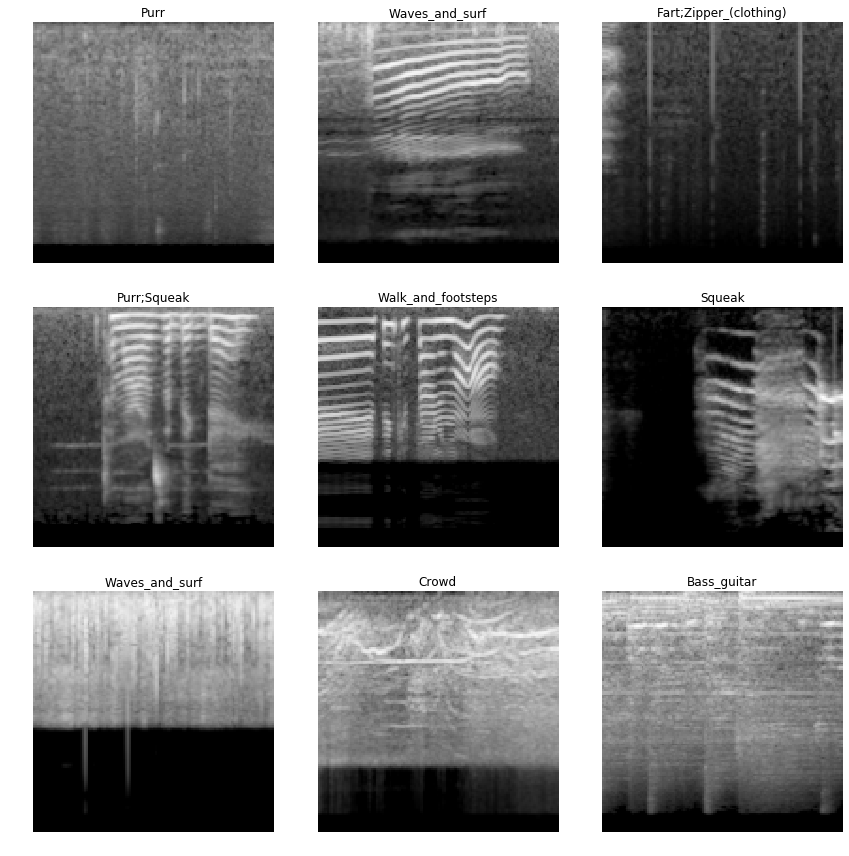

In [22]:
for fold, (train_index, valid_index) in enumerate(kf_noisy.split(trn_noisy_df)):
    print('-' * 40, f'NOISY - Fold {fold+1}/{n_splits}', '-' * 40)
    
    src = (ImageList.from_df(trn_noisy_df, WORK)
           .split_by_idxs(train_index, valid_index)
           .label_from_df(label_delim=',')
    )
    data = (src.transform(tfms, size=128)
            .databunch(bs=bs)
    )
    data.show_batch(3)
    plt.show()
    
    learn = cnn_learner(data, borrowed_model, pretrained=False, metrics=[Lwlrap()])
    learn.callback_fns.append(MyMixUpCallback)
    learn.unfreeze()
    
    assert learn.data.classes == labels
#     break
    learning(learn, 10, slice(1e-5, 3e-2))
    learning(learn, 100, 1e-3)
    
    learn.save(f'stage-1_fold-{fold}')

    if TOY_MODE:
        break

In [23]:
learn.model

Sequential(
  (0): Sequential(
    (0): Sequential(
      (0): ConvBlock(
        (conv1): Sequential(
          (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU()
        )
        (conv2): Sequential(
          (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU()
        )
      )
      (1): ConvBlock(
        (conv1): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU()
        )
        (conv2): Sequential(
          (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, tr

In [24]:
kfold_lwlrap('CURATED', kf_curated, trn_curated_df, 'stage-1_fold-{fold}')

Overall lwlrap on CURATED dataset: 0.41096481268327745


,lwlrap,weight
Tap,0.027562,0.013039
Raindrop,0.030165,0.013039
Yell,0.045917,0.013039
Female_speech_and_woman_speaking,0.051134,0.013039
Male_speech_and_man_speaking,0.078842,0.013039
Run,0.091376,0.013039
Cupboard_open_or_close,0.093436,0.013039
Whispering,0.132053,0.013039
Fill_(with_liquid),0.138031,0.008693
Bass_drum,0.144150,0.013039


In [25]:
kfold_lwlrap('NOISY', kf_noisy, trn_noisy_df, 'stage-1_fold-{fold}')

Overall lwlrap on NOISY dataset: 0.6505740867763616


,lwlrap,weight
Zipper_(clothing),0.248449,0.0125
Burping_and_eructation,0.248790,0.0125
Fart,0.310956,0.0125
Buzz,0.381784,0.0125
Gasp,0.394716,0.0125
Writing,0.396788,0.0125
Sneeze,0.396947,0.0125
Finger_snapping,0.425786,0.0125
Computer_keyboard,0.446361,0.0125
Tick-tock,0.450959,0.0125


### Train on curated data

---------------------------------------- CURATED - Fold 1/10 ----------------------------------------


/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


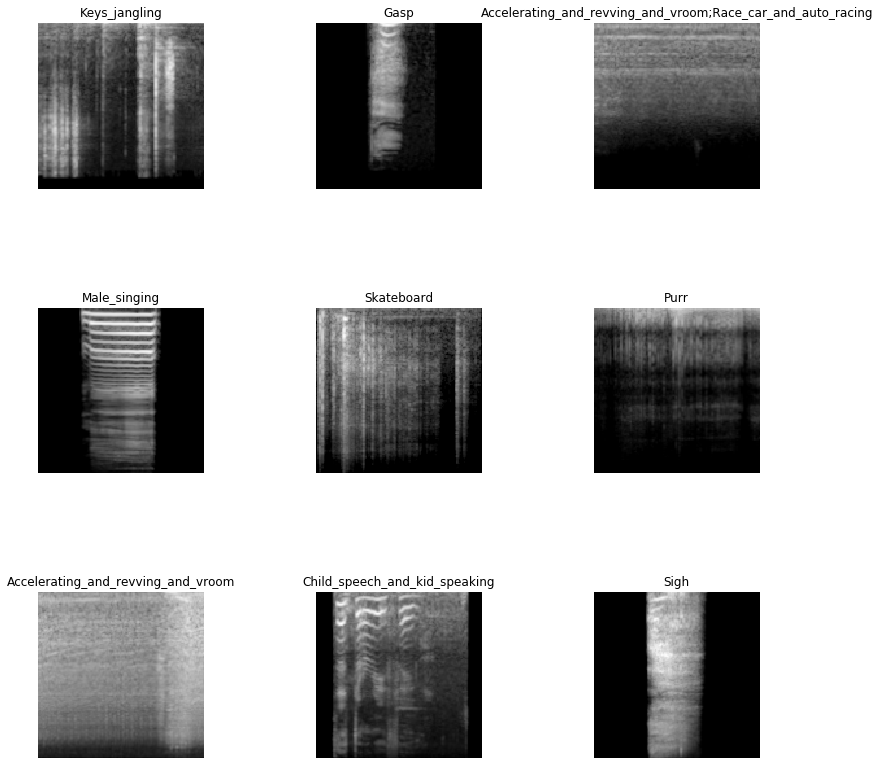

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


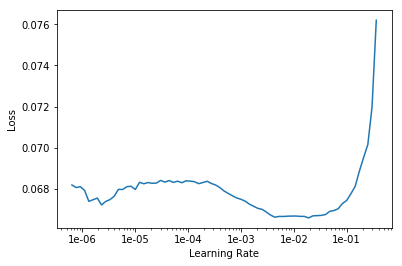

epoch,train_loss,valid_loss,lwlrap,time
0,0.067866,0.055346,0.408862,00:11
1,0.066923,0.052537,0.447787,00:10
2,0.066184,0.050595,0.472755,00:10
3,0.065301,0.049942,0.486378,00:10
4,0.064648,0.048257,0.509498,00:10
5,0.063915,0.047690,0.513258,00:10
6,0.063022,0.045798,0.555040,00:10
7,0.062773,0.045198,0.561189,00:10
8,0.062113,0.043846,0.588285,00:10
9,0.061522,0.043352,0.589102,00:10


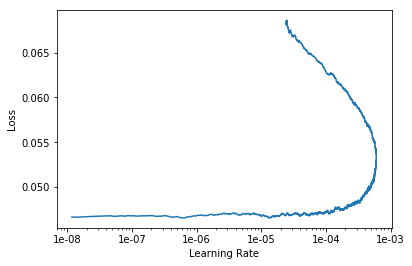

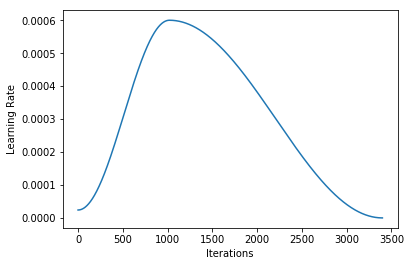

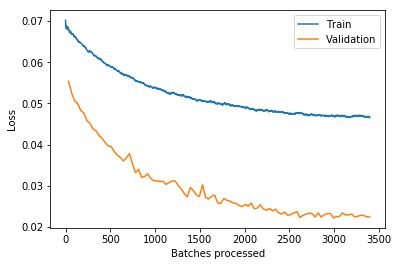

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED - Fold 2/10 ----------------------------------------


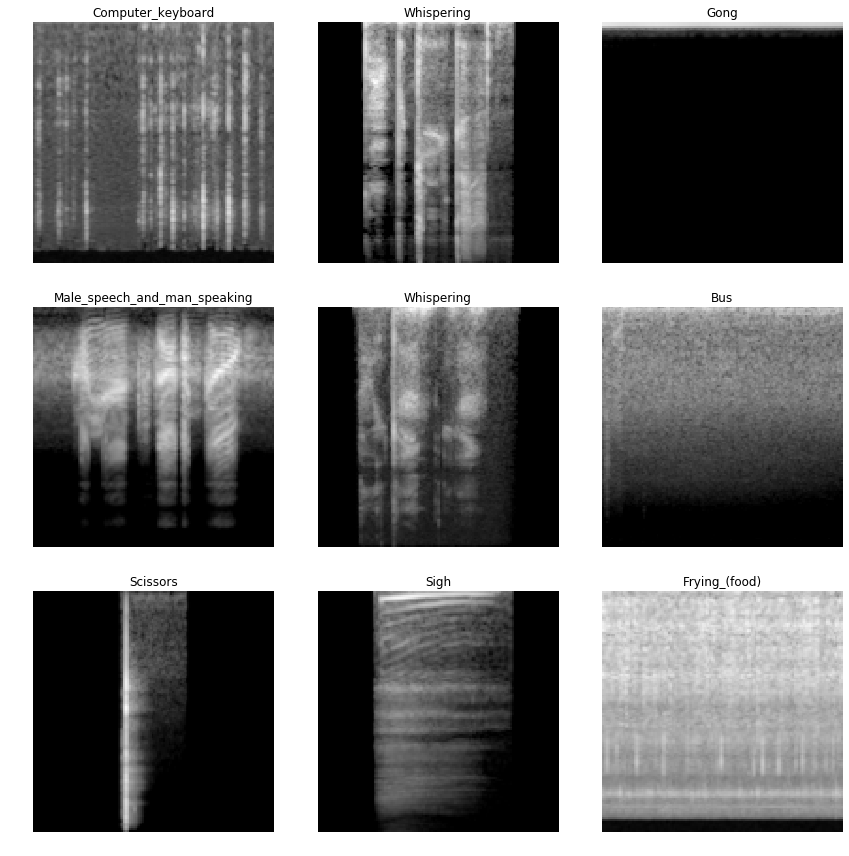

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


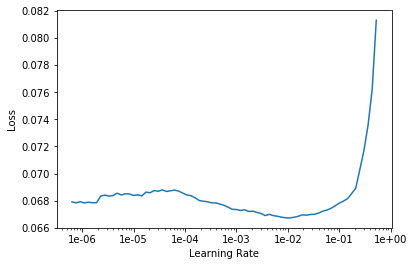

epoch,train_loss,valid_loss,lwlrap,time
0,0.068434,0.055376,0.418316,00:10
1,0.067394,0.052947,0.458699,00:10
2,0.066347,0.051080,0.474810,00:10
3,0.065625,0.050052,0.495010,00:10
4,0.064813,0.048925,0.519421,00:10
5,0.064003,0.046802,0.534355,00:10
6,0.063277,0.046437,0.550619,00:10
7,0.062637,0.045552,0.557155,00:10
8,0.062064,0.044950,0.589955,00:10
9,0.061358,0.043031,0.623684,00:10


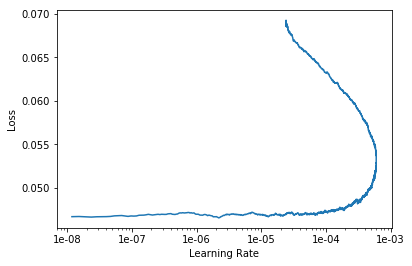

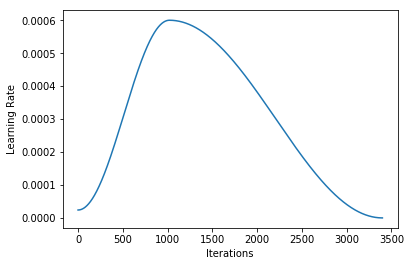

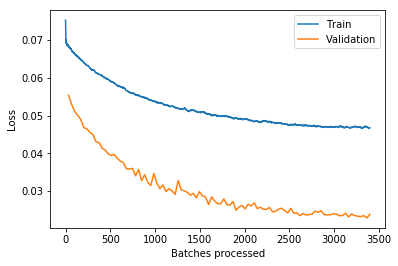

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED - Fold 3/10 ----------------------------------------


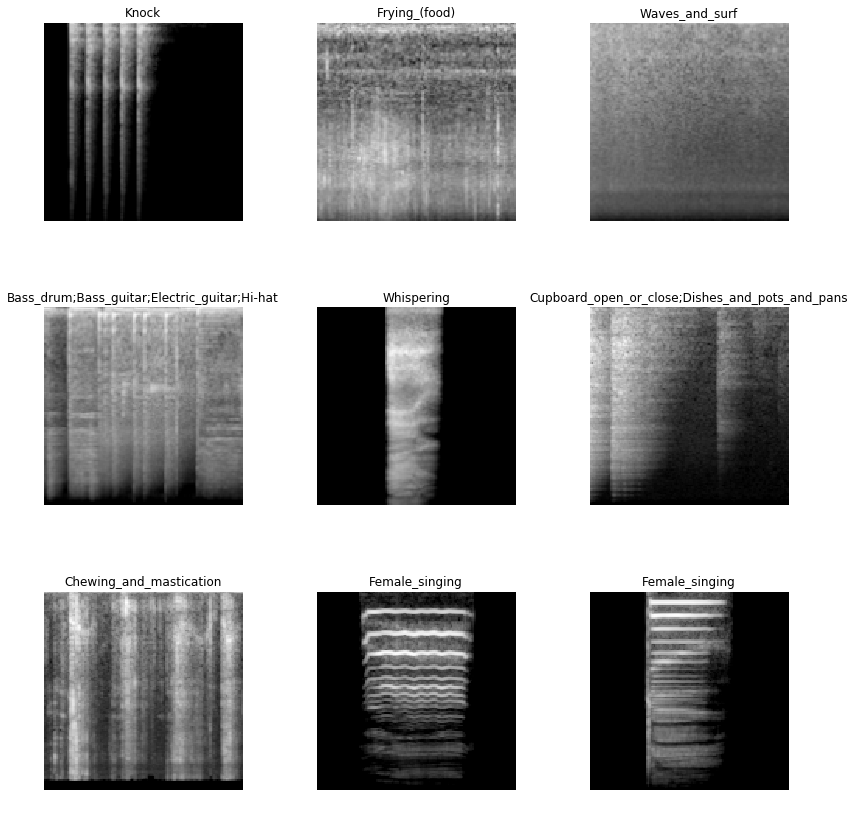

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


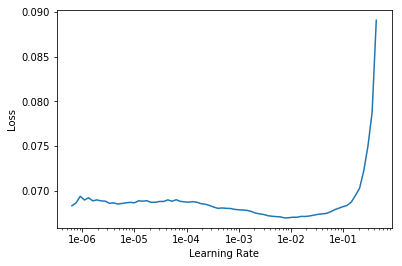

epoch,train_loss,valid_loss,lwlrap,time
0,0.068403,0.054323,0.402808,00:10
1,0.067302,0.052254,0.439193,00:10
2,0.066378,0.050900,0.458043,00:10
3,0.065665,0.049487,0.477995,00:10
4,0.064977,0.048812,0.490253,00:10
5,0.064224,0.047315,0.518597,00:10
6,0.063522,0.046138,0.542084,00:10
7,0.062909,0.045326,0.539836,00:10
8,0.062482,0.044069,0.566573,00:10
9,0.061820,0.043354,0.591176,00:10


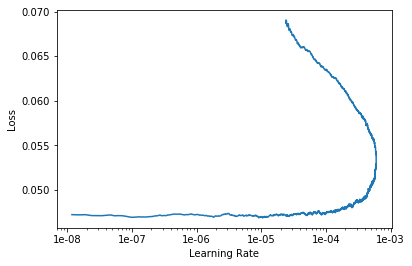

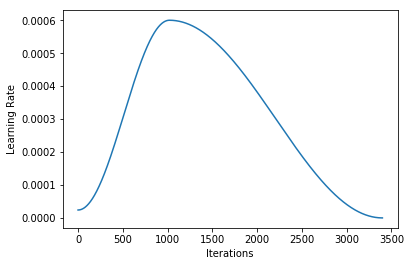

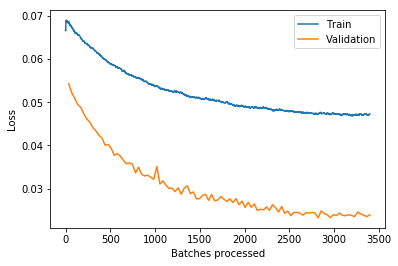

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED - Fold 4/10 ----------------------------------------


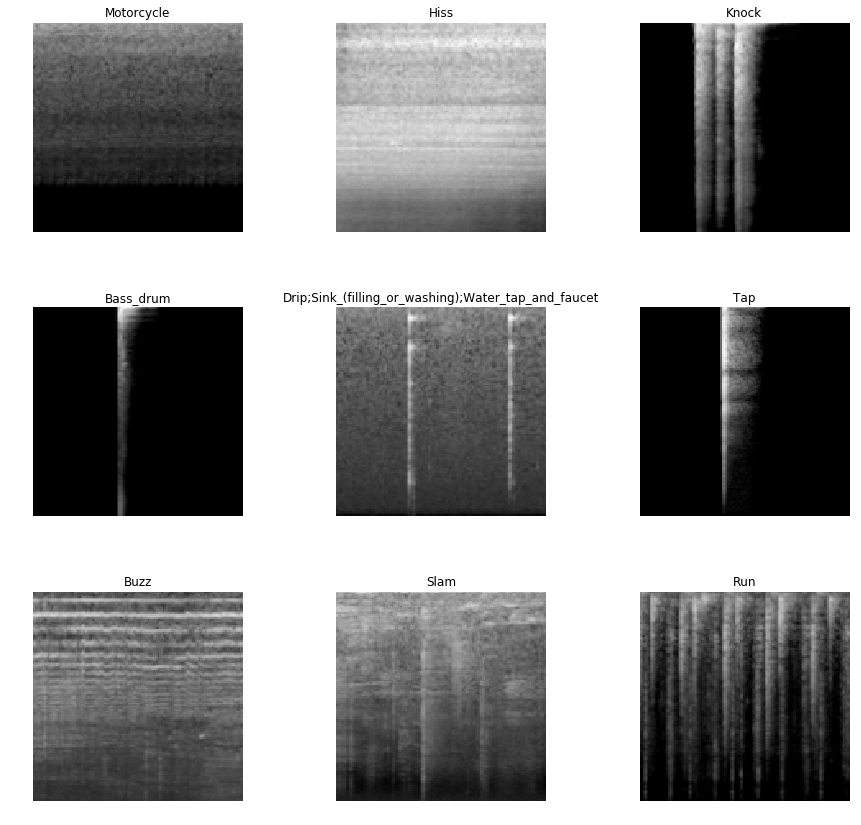

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


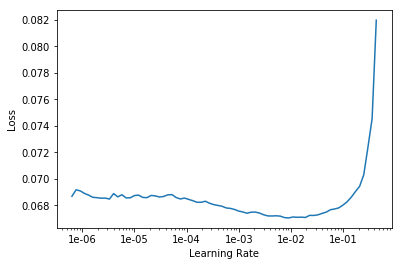

epoch,train_loss,valid_loss,lwlrap,time
0,0.068305,0.053503,0.452716,00:10
1,0.067168,0.052031,0.462611,00:10
2,0.066370,0.049883,0.501358,00:10
3,0.065642,0.048670,0.511634,00:10
4,0.064967,0.046999,0.540920,00:10
5,0.064191,0.045504,0.564924,00:10
6,0.063388,0.045211,0.585965,00:10
7,0.062558,0.044349,0.592418,00:10
8,0.062062,0.043088,0.602161,00:10
9,0.061538,0.042530,0.623057,00:10


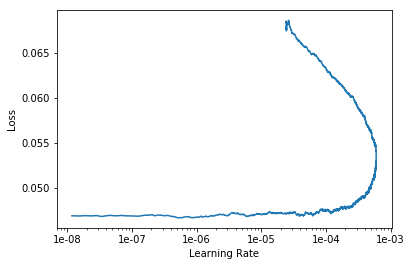

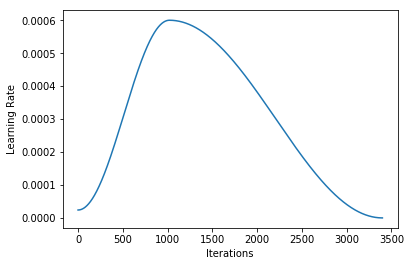

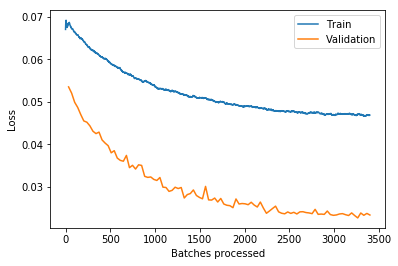

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED - Fold 5/10 ----------------------------------------


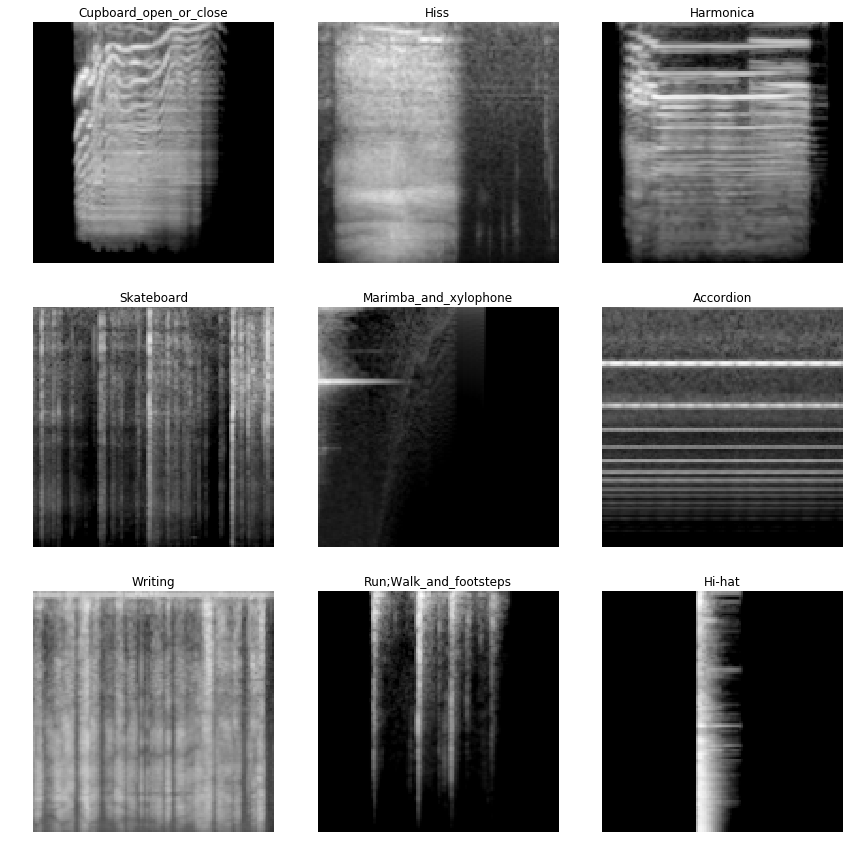

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


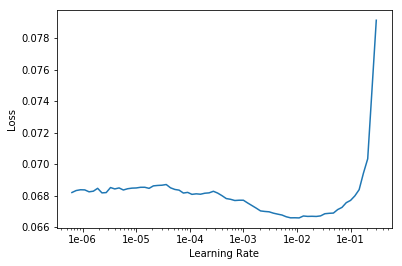

epoch,train_loss,valid_loss,lwlrap,time
0,0.067845,0.053399,0.464275,00:10
1,0.067256,0.051696,0.477656,00:10
2,0.066229,0.049707,0.504184,00:10
3,0.065616,0.049530,0.509044,00:10
4,0.064889,0.048369,0.526988,00:10
5,0.064240,0.046776,0.546110,00:10
6,0.063413,0.045902,0.559164,00:10
7,0.062754,0.044589,0.590870,00:10
8,0.062036,0.044062,0.597335,00:10
9,0.061476,0.042942,0.625444,00:10


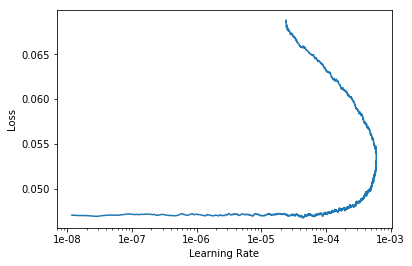

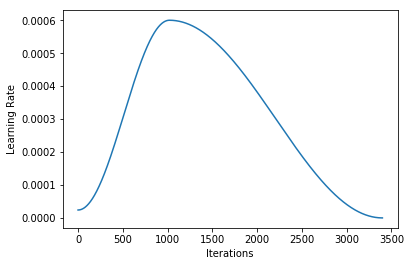

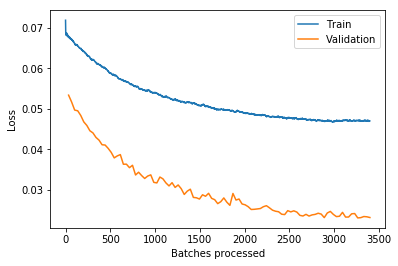

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED - Fold 6/10 ----------------------------------------


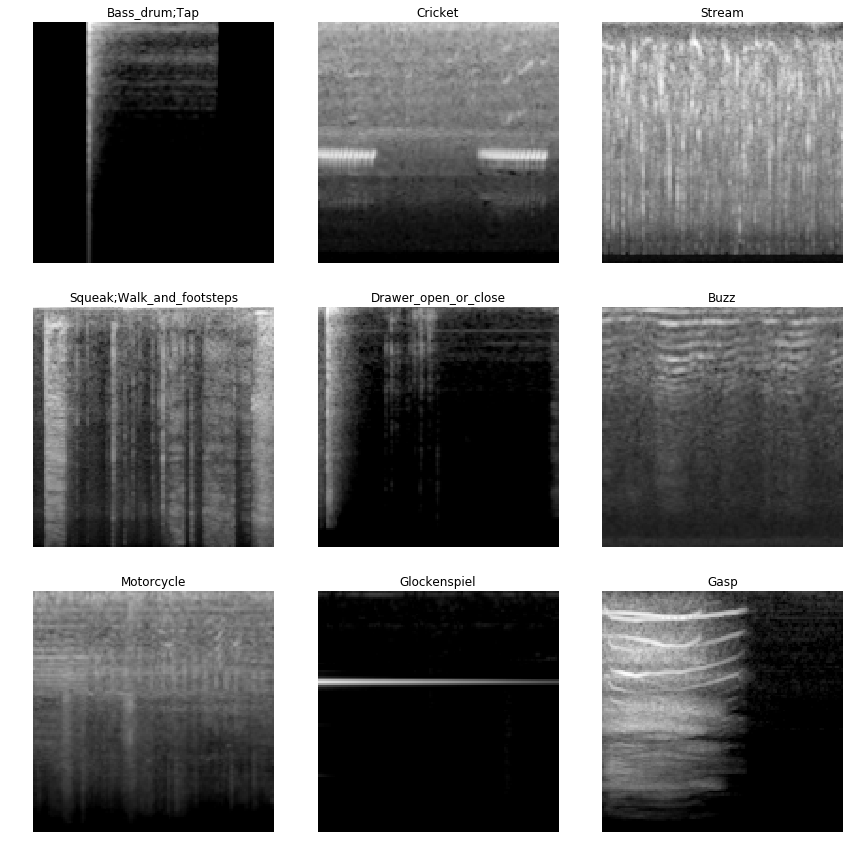

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


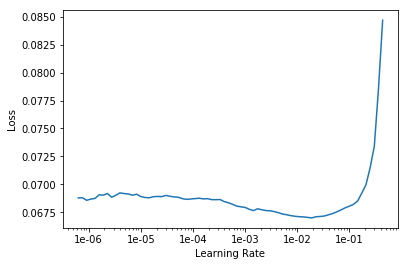

epoch,train_loss,valid_loss,lwlrap,time
0,0.068218,0.053511,0.447022,00:10
1,0.067224,0.051269,0.481466,00:10
2,0.066481,0.049857,0.485509,00:10
3,0.065785,0.048785,0.503204,00:10
4,0.064936,0.047963,0.516308,00:10
5,0.064136,0.046633,0.544908,00:10
6,0.063287,0.045124,0.558814,00:10
7,0.062708,0.045557,0.556973,00:10
8,0.062166,0.043512,0.584187,00:10
9,0.061633,0.043025,0.597525,00:10


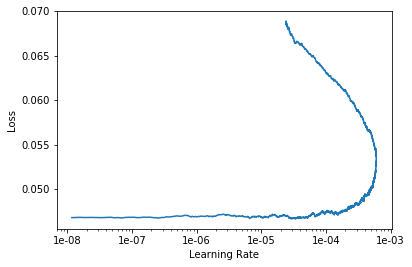

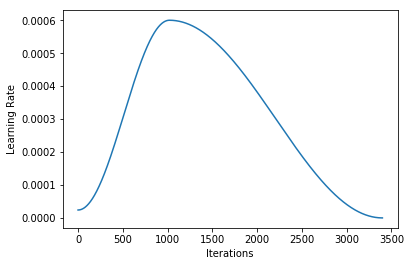

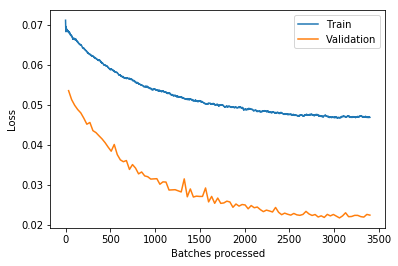

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED - Fold 7/10 ----------------------------------------


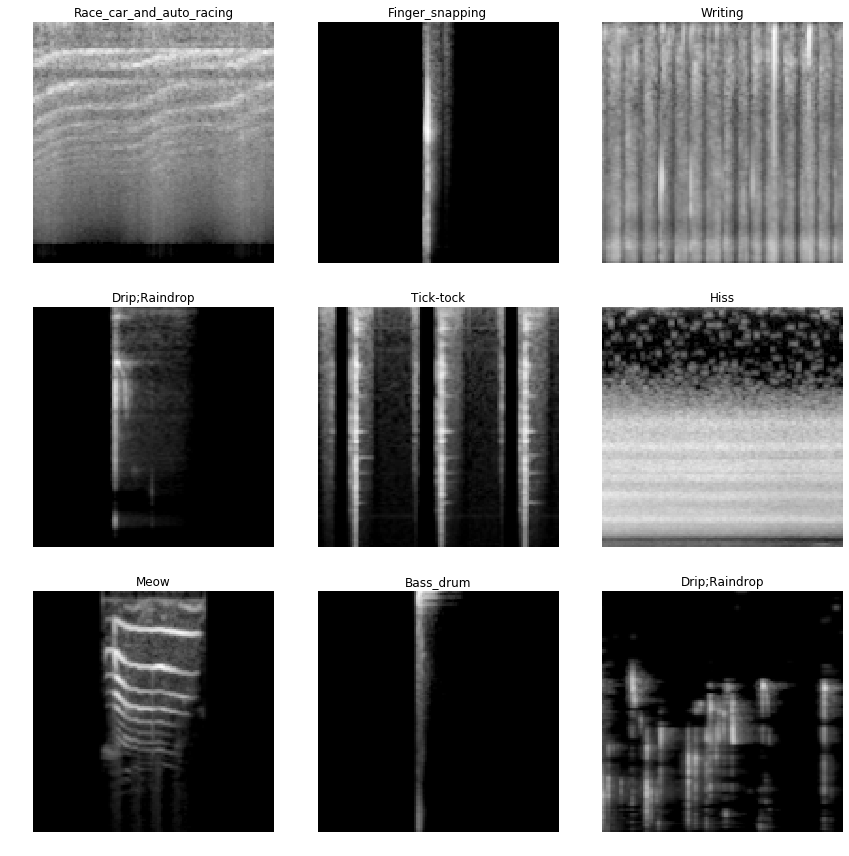

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


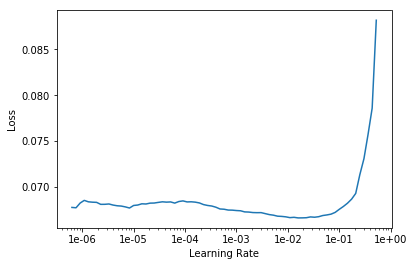

epoch,train_loss,valid_loss,lwlrap,time
0,0.067820,0.056111,0.441370,00:10
1,0.066980,0.052661,0.482764,00:10
2,0.066143,0.051761,0.499426,00:10
3,0.065345,0.049621,0.512956,00:10
4,0.064668,0.048258,0.545881,00:10
5,0.064032,0.046445,0.563697,00:10
6,0.063285,0.045792,0.572174,00:10
7,0.062543,0.044883,0.593601,00:10
8,0.062016,0.044050,0.598059,00:10
9,0.061397,0.043225,0.620751,00:10


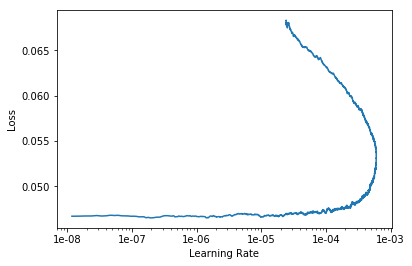

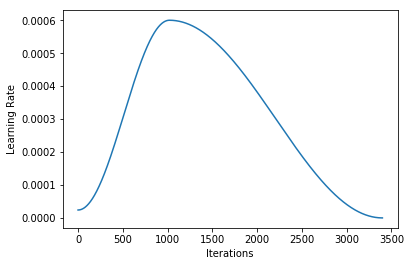

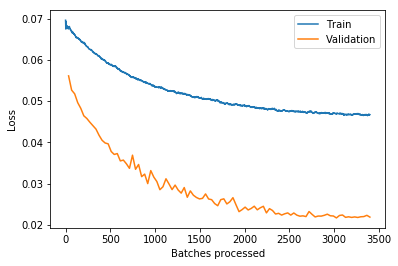

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED - Fold 8/10 ----------------------------------------


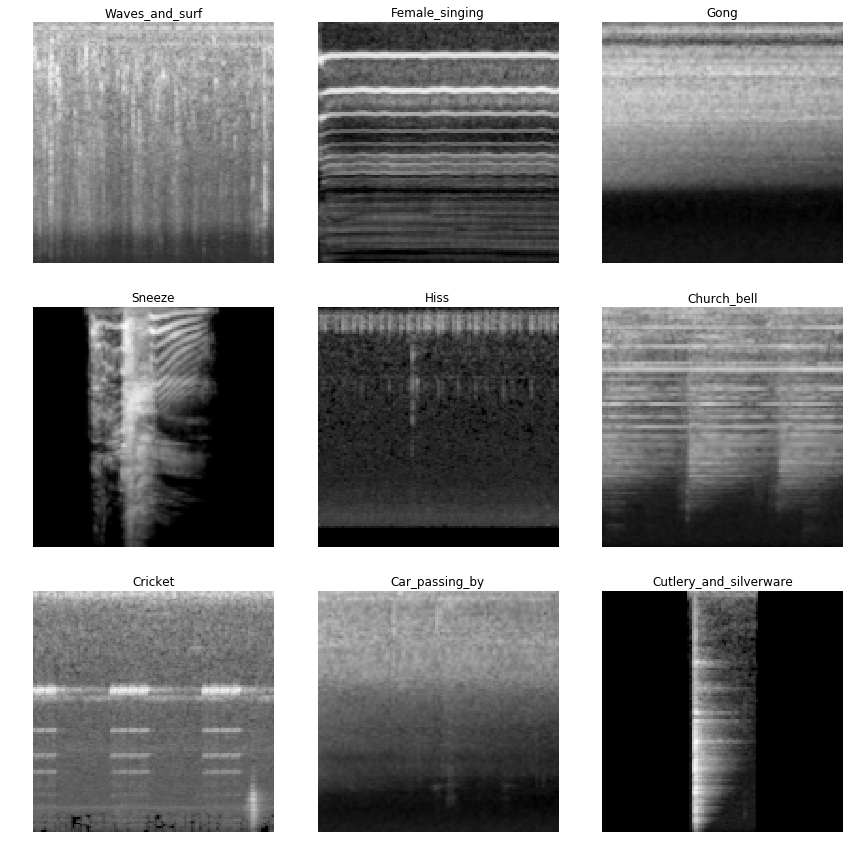

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


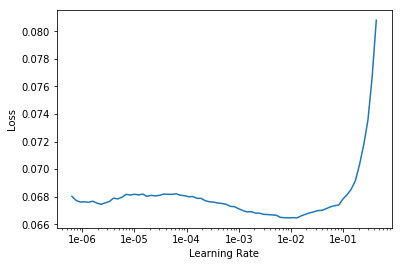

epoch,train_loss,valid_loss,lwlrap,time
0,0.067870,0.055235,0.417623,00:10
1,0.066837,0.053790,0.450238,00:10
2,0.066050,0.051794,0.475368,00:10
3,0.065268,0.050471,0.491169,00:10
4,0.064602,0.049076,0.517110,00:10
5,0.063771,0.048655,0.527178,00:10
6,0.063270,0.047581,0.541648,00:10
7,0.062435,0.047126,0.561008,00:10
8,0.061849,0.045113,0.589007,00:10
9,0.061235,0.045074,0.600626,00:10


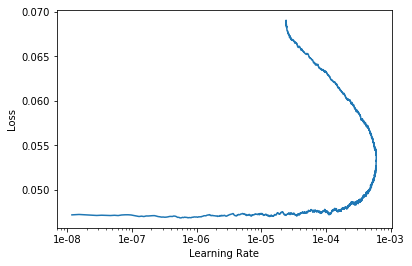

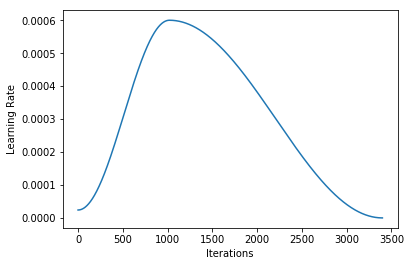

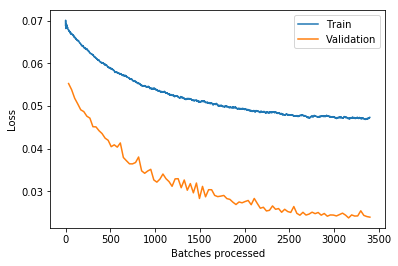

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED - Fold 9/10 ----------------------------------------


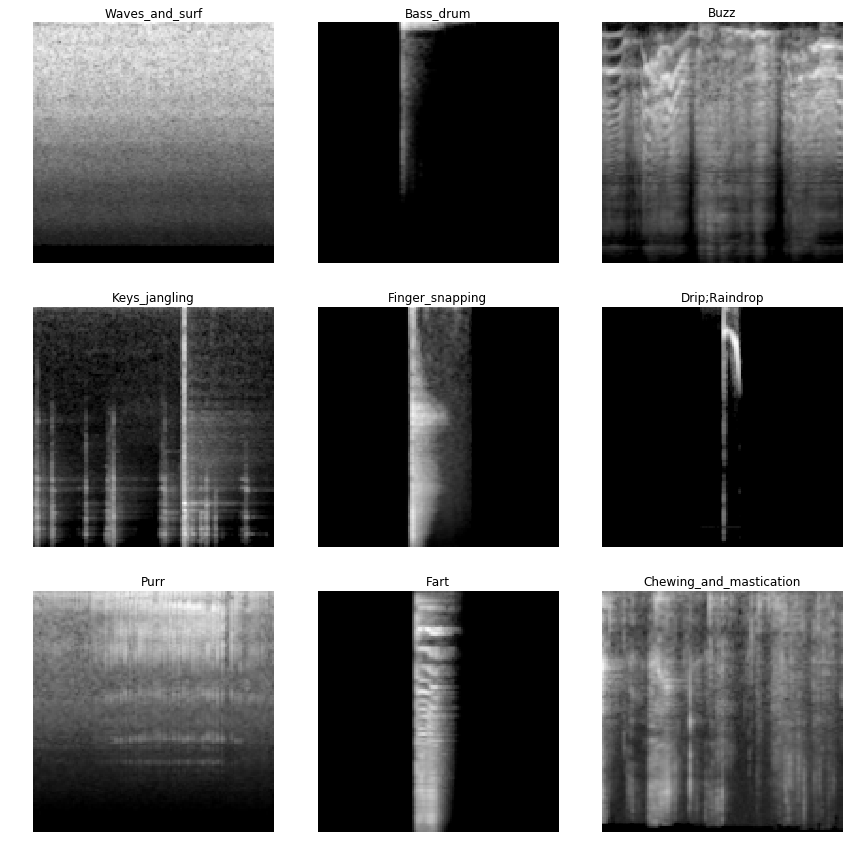

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


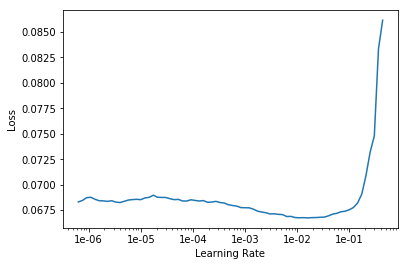

epoch,train_loss,valid_loss,lwlrap,time
0,0.068185,0.054233,0.443308,00:10
1,0.067239,0.051328,0.471018,00:10
2,0.066451,0.049355,0.501174,00:10
3,0.065602,0.048182,0.508987,00:10
4,0.064850,0.046783,0.535360,00:10
5,0.064069,0.045888,0.558231,00:10
6,0.063407,0.044306,0.583845,00:10
7,0.062775,0.043720,0.590483,00:10
8,0.062149,0.042208,0.619397,00:10
9,0.061578,0.040626,0.643714,00:10


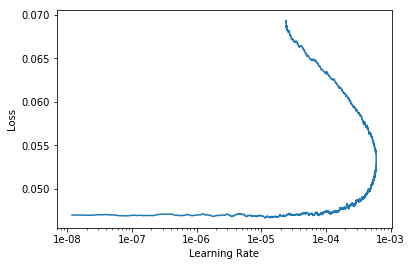

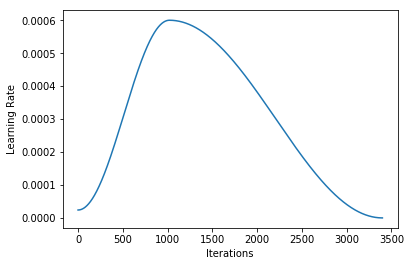

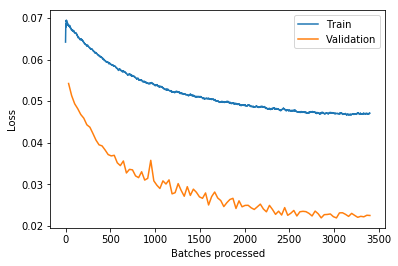

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED - Fold 10/10 ----------------------------------------


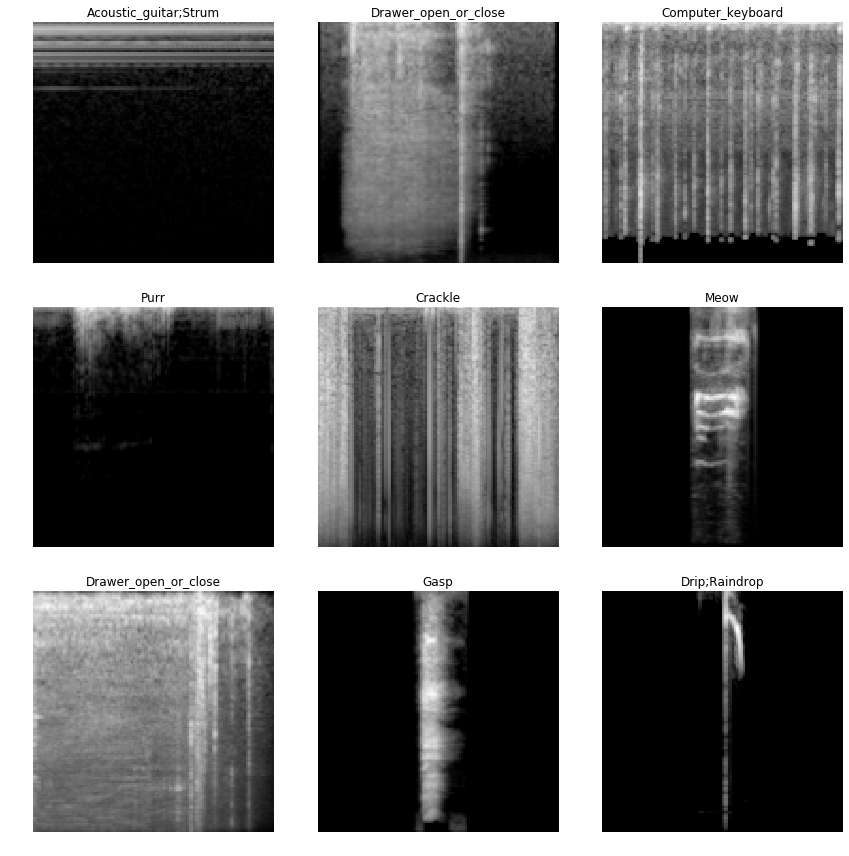

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


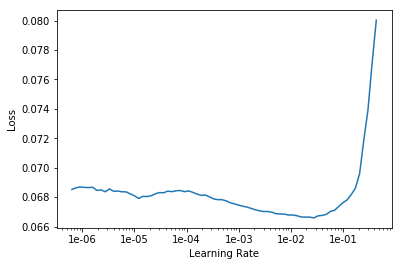

epoch,train_loss,valid_loss,lwlrap,time
0,0.068041,0.054592,0.431336,00:10
1,0.067200,0.051769,0.469170,00:10
2,0.066111,0.050633,0.498281,00:10
3,0.065422,0.048908,0.515635,00:10
4,0.064658,0.047710,0.545453,00:10
5,0.064010,0.046402,0.564189,00:10
6,0.063280,0.045171,0.570703,00:10
7,0.062639,0.043584,0.592577,00:10
8,0.061968,0.043056,0.610842,00:10
9,0.061616,0.041773,0.621353,00:10


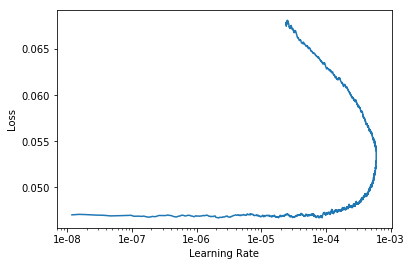

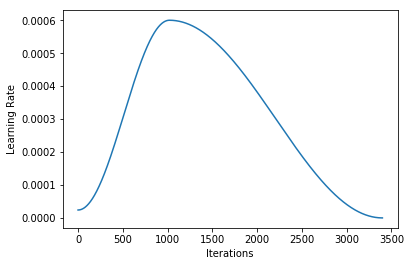

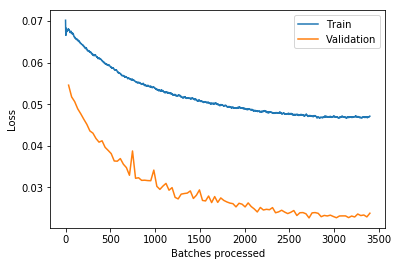

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [26]:
for fold, (train_index, valid_index) in enumerate(kf_curated.split(trn_curated_df)):
    print('-' * 40, f'CURATED - Fold {fold+1}/{n_splits}', '-' * 40)

    learn.load(f'stage-1_fold-{fold}')

    src = (ImageList.from_df(trn_curated_df, WORK)
           .split_by_idxs(train_index, valid_index)
           .label_from_df(label_delim=',')
    )
    data = (src.transform(tfms, size=128)
            .databunch(bs=bs)
    )
    data.show_batch(3)
    plt.show()
    
    
    learn.data = data

    learning(learn, 100, 3e-3 / 5)

    learn.save(f'stage-2_fold-{fold}')
    learn.export(f'stage-2_fold-{fold}.pkl')
    
    if TOY_MODE:
        break

In [27]:
kfold_lwlrap('CURATED', kf_curated, trn_curated_df, 'stage-2_fold-{fold}')

Overall lwlrap on CURATED dataset: 0.8622168112364244


,lwlrap,weight
Fill_(with_liquid),0.529234,0.008693
Squeak,0.611169,0.013039
Hiss,0.691345,0.013039
Chink_and_clink,0.705192,0.013039
Walk_and_footsteps,0.705671,0.013039
Gasp,0.714394,0.008345
Tap,0.739426,0.013039
Mechanical_fan,0.742898,0.008519
Trickle_and_dribble,0.747705,0.009214
Bus,0.756433,0.013039


In [28]:
kfold_lwlrap('NOISY', kf_noisy, trn_noisy_df, 'stage-2_fold-{fold}')

Overall lwlrap on NOISY dataset: 0.3814153195846499


,lwlrap,weight
Cupboard_open_or_close,0.050421,0.0125
Raindrop,0.062463,0.0125
Finger_snapping,0.064026,0.0125
Tap,0.078296,0.0125
Burping_and_eructation,0.091234,0.0125
Sigh,0.098085,0.0125
Keys_jangling,0.100882,0.0125
Shatter,0.101463,0.0125
Drip,0.115767,0.0125
Gasp,0.120609,0.0125


### Look for useful noisy samples

In [31]:
def lwlrap_per_element(fname):
    overall_preds, overall_thruth, overall_index = _kfold_prediction(kf_noisy, trn_noisy_df, fname)
    
    m = np.zeros_like(overall_preds)
    for i, (p, t) in enumerate(zip(overall_preds, overall_thruth)):
        idx, val =_one_sample_positive_class_precisions(p, t)
        m[i, idx] = val
    m = pd.DataFrame(m, columns=learn.data.classes, index=overall_index)
    
    m['fname'] = trn_noisy_df.fname

    for fold, (train_index, valid_index) in enumerate(kf_noisy.split(trn_noisy_df)):
        m.at[valid_index, 'fold'] = fold

    return m

In [32]:
m1 = lwlrap_per_element('stage-1_fold-{fold}')

In [33]:
m2 = lwlrap_per_element('stage-2_fold-{fold}')

In [34]:
m = m1.copy()
m[learn.data.classes] = np.sqrt(m1[learn.data.classes] * m2[learn.data.classes])

In [35]:
del m1, m2
gc.collect();

In [36]:
# Select samples from noisy dataset that look promising:
# - suppose correct label from organiser
# - high lwlrap on stage 1 (model with noisy elements only)
# - high lwlrap on stage 2 (model warmed up with noisy elements and then fine tuned with curated dataset)

lwlrap_threshold = .5
count_limit = 5  # per fold and per class

ok_noisy_items = []

for i, x in enumerate(learn.data.classes):
    print('\n', '*' * 20, x, '*' * 20)
    print('Found' , m[(m[x] >= lwlrap_threshold)].shape[0], 'promising element(s)')
    for fold in range(n_splits):
        selected = m[(m[x] >= lwlrap_threshold) & (m.fold == fold)].sort_values(x, ascending=False)[:count_limit].index
        ok_noisy_items.extend(selected)
        print('fold ', fold, ':', m[(m[x] >= lwlrap_threshold) & (m.fold == fold)].shape[0], m.iloc[selected].fname.tolist())

print('\nFinal selection includes', len(ok_noisy_items), '"noisy" items')


 ******************** Accelerating_and_revving_and_vroom ********************
Found 148 promising element(s)
fold  0 : 15 ['08d8148a.wav', 'a4435a9d.wav', 'bddcf02f.wav', '34a8b8db.wav', '9076a3e2.wav']
fold  1 : 11 ['c092764a.wav', '7a22fec9.wav', 'f682f18c.wav', '3c2f3122.wav', '87fac7cf.wav']
fold  2 : 10 ['1b5fda28.wav', '8119602a.wav', '3d18e0a3.wav', 'e445db5e.wav', 'ffd1c0e2.wav']
fold  3 : 15 ['a0da98c4.wav', '33ab75d8.wav', '38b3d195.wav', 'b84be9e3.wav', 'a7063b6a.wav']
fold  4 : 17 ['f5a8204a.wav', 'a2ae680a.wav', 'a1e99e2b.wav', 'c5e0e576.wav', 'e79da000.wav']
fold  5 : 16 ['413f17c4.wav', 'ac830ed7.wav', 'e4298185.wav', '73bfc028.wav', 'ab1c9211.wav']
fold  6 : 15 ['0af6c5e5.wav', 'e5165478.wav', '1924aa99.wav', 'bc69bdfe.wav', 'd140606a.wav']
fold  7 : 19 ['049998bc.wav', '4d335487.wav', '49034bb5.wav', 'af229cd1.wav', 'e8d63fcb.wav']
fold  8 : 14 ['f13ae3d3.wav', 'c5e85231.wav', '2872af5d.wav', '750c435b.wav', '77b14052.wav']
fold  9 : 16 ['a6631a37.wav', 'f683db6f.wav'

fold  6 : 4 ['27b40a92.wav', '1e0b3f60.wav', '3d77b202.wav', '072aee3f.wav']
fold  7 : 4 ['1681c859.wav', '8b012ef1.wav', '11d45558.wav', 'f4bba82c.wav']
fold  8 : 5 ['b2f68728.wav', '12359f23.wav', '8a234a62.wav', '5a49afb7.wav', 'e8dacb40.wav']
fold  9 : 6 ['9916887e.wav', '52ce072a.wav', '5ef977b9.wav', '1a6c4e69.wav', '19e4fc03.wav']

 ******************** Child_speech_and_kid_speaking ********************
Found 190 promising element(s)
fold  0 : 23 ['119f1e91.wav', '8f38da94.wav', '64049af7.wav', 'b712fb1c.wav', '3a649485.wav']
fold  1 : 21 ['2065b61a.wav', '883522ca.wav', 'fc17c45e.wav', '9bfa532e.wav', 'f9e32867.wav']
fold  2 : 24 ['2654431d.wav', '821c2def.wav', '66b03a88.wav', '3f516fde.wav', '0f9fab71.wav']
fold  3 : 15 ['d294363b.wav', '4376db64.wav', 'c405d161.wav', '522ed46f.wav', '9767f0ea.wav']
fold  4 : 21 ['fcfcf2ac.wav', '4c92fa31.wav', 'e5e17028.wav', 'f9d4c615.wav', '27e32c51.wav']
fold  5 : 19 ['2e98bdb2.wav', '48e0fdb3.wav', '4c0056be.wav', 'beff2995.wav', 'c21754

fold  8 : 16 ['ff0334b9.wav', '219d6182.wav', 'ecc68740.wav', '5470e84b.wav', 'a957b351.wav']
fold  9 : 15 ['461b02c5.wav', '89e02443.wav', '09c52e29.wav', '231219ed.wav', '9705a317.wav']

 ******************** Fart ********************
Found 18 promising element(s)
fold  0 : 2 ['b671e9c3.wav', '713880d9.wav']
fold  1 : 0 []
fold  2 : 1 ['6da0ff4c.wav']
fold  3 : 1 ['d7ba52f4.wav']
fold  4 : 3 ['492fc2c1.wav', '6ec99f8a.wav', 'd3e9be6f.wav']
fold  5 : 3 ['26b1650d.wav', 'ed459579.wav', 'e0e7dbc0.wav']
fold  6 : 1 ['136bad2e.wav']
fold  7 : 3 ['0ccb7f89.wav', 'f92ae43e.wav', '88cb3437.wav']
fold  8 : 2 ['110f7af6.wav', '37133dea.wav']
fold  9 : 2 ['2ea7588c.wav', '17c82bcf.wav']

 ******************** Female_singing ********************
Found 180 promising element(s)
fold  0 : 18 ['7ced05f6.wav', '0ff744af.wav', 'b43c1017.wav', 'a891671a.wav', '7d9738d8.wav']
fold  1 : 16 ['0ed00121.wav', '3ea24946.wav', '1ec8afc4.wav', '54979581.wav', '911b195b.wav']
fold  2 : 15 ['e95868b1.wav', 'b401

fold  9 : 3 ['52a2f879.wav', '3871946f.wav', '48337b1a.wav']

 ******************** Male_singing ********************
Found 151 promising element(s)
fold  0 : 10 ['550a11b3.wav', 'e1dc8ccb.wav', 'ff5e3c2f.wav', 'd83c2ea8.wav', '92a0f453.wav']
fold  1 : 11 ['04aad166.wav', 'e5bc3e41.wav', '668c3fc3.wav', 'df2f3d17.wav', 'd9d4692a.wav']
fold  2 : 17 ['e147cd9d.wav', '8f15518d.wav', '959dbce7.wav', '734b6c55.wav', '370718a3.wav']
fold  3 : 19 ['9978db44.wav', '14db2e69.wav', '302ffd7a.wav', '07e344d4.wav', 'a6c2b6e3.wav']
fold  4 : 20 ['53fe12a2.wav', '1f157493.wav', 'be8d0b43.wav', '31b0f2ed.wav', 'b6e482f2.wav']
fold  5 : 13 ['fb1c210f.wav', '0950f2f8.wav', '69adf8fc.wav', 'a361656b.wav', 'b245cde6.wav']
fold  6 : 13 ['6c6905e8.wav', 'fefd012f.wav', '0fb7d41a.wav', '0db6d829.wav', 'd66efb5b.wav']
fold  7 : 18 ['7a9c81e4.wav', '558ac4eb.wav', 'ff93de40.wav', '403effd9.wav', '78d80c3f.wav']
fold  8 : 15 ['a45579bf.wav', 'ad07900c.wav', '115214e6.wav', '9b2744be.wav', 'b343df8f.wav']
fold 

fold  1 : 2 ['a4c24a53.wav', 'ef4aadaf.wav']
fold  2 : 2 ['3545a7f6.wav', 'e4210a2d.wav']
fold  3 : 2 ['3d5d5cec.wav', '2376ec20.wav']
fold  4 : 0 []
fold  5 : 3 ['dfc3435c.wav', '47d5b210.wav', 'ed1156e3.wav']
fold  6 : 2 ['0c6ec6ed.wav', '7b315c24.wav']
fold  7 : 3 ['3ec82568.wav', '1cdceee6.wav', '92079f36.wav']
fold  8 : 0 []
fold  9 : 2 ['5362b353.wav', 'a7563dca.wav']

 ******************** Sink_(filling_or_washing) ********************
Found 175 promising element(s)
fold  0 : 21 ['1631cb12.wav', '8da955a7.wav', '4fad5b40.wav', '8beb12b8.wav', 'dbac2653.wav']
fold  1 : 25 ['2bc41070.wav', 'ccbecf76.wav', '4cba4804.wav', 'a3b450e1.wav', '5676f85b.wav']
fold  2 : 17 ['2db59ccf.wav', '21d63c87.wav', '35718831.wav', 'c515cbba.wav', '7d1e186d.wav']
fold  3 : 12 ['a0762866.wav', '8c2ef0d6.wav', '4c085163.wav', 'a1f64728.wav', 'b470b8fb.wav']
fold  4 : 17 ['21aa178b.wav', 'd5fe3b70.wav', 'f5fbc0e9.wav', '60548ca9.wav', '6611caf8.wav']
fold  5 : 15 ['a9f48fd0.wav', '5434989d.wav', '9d153

fold  4 : 22 ['573d93df.wav', '0c28675b.wav', 'ac1c163a.wav', '7feccf12.wav', '6d34b39f.wav']
fold  5 : 26 ['80d532bc.wav', '96db3db7.wav', '9886c1e8.wav', '8970fd79.wav', '11993427.wav']
fold  6 : 18 ['09dd95ba.wav', '488061aa.wav', 'f33eb855.wav', '3b0fc06c.wav', 'e27e6862.wav']
fold  7 : 19 ['3a736398.wav', '846be83c.wav', 'a65b2cc6.wav', 'bd4b7e92.wav', '5df941f1.wav']
fold  8 : 31 ['788c2a39.wav', '01cf98ed.wav', 'e02e4262.wav', '7745a6c0.wav', '1c3e170a.wav']
fold  9 : 30 ['75be5b00.wav', 'fd97aa6f.wav', '9d08b255.wav', '871339a7.wav', '5ba43a2c.wav']

 ******************** Whispering ********************
Found 66 promising element(s)
fold  0 : 6 ['4e7fd59b.wav', '8972879d.wav', 'c5872604.wav', 'bd05e699.wav', '43a45bb8.wav']
fold  1 : 7 ['5f833dca.wav', 'ad1509b7.wav', '758f8cc5.wav', 'a8a23a5e.wav', 'ebb2fbf2.wav']
fold  2 : 6 ['4264d590.wav', '4d7e2b79.wav', '4e8db52a.wav', '531c11db.wav', '8d2b2879.wav']
fold  3 : 5 ['a2235869.wav', '282aa145.wav', '4a67c503.wav', '6466394d.w

## Train on Selected Noisy + Curated

---------------------------------------- CURATED+NOISY - Fold 1/10 ----------------------------------------


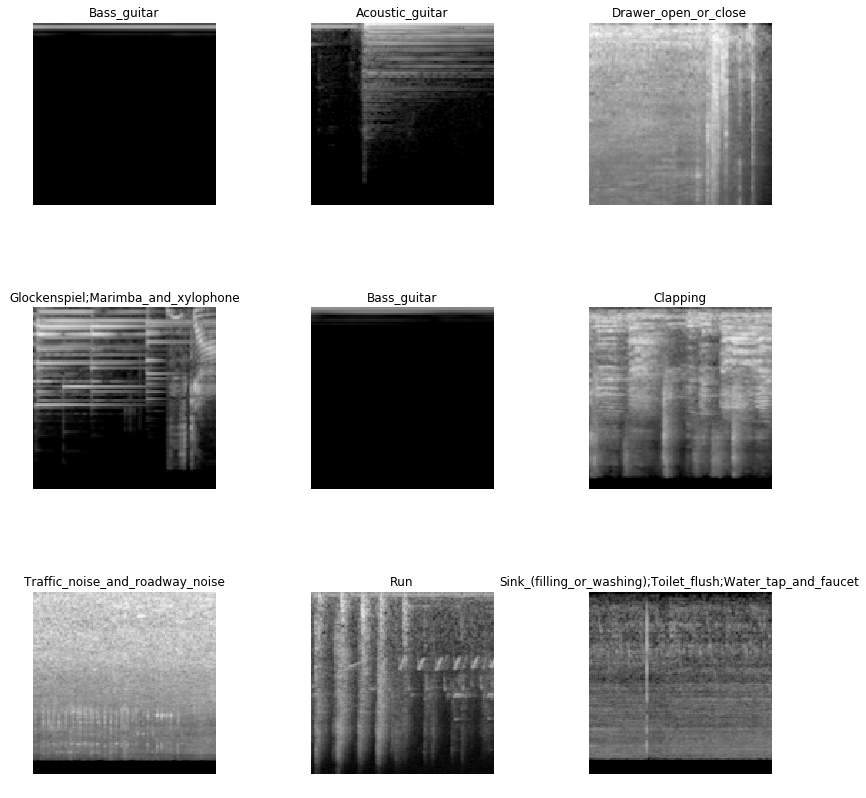

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


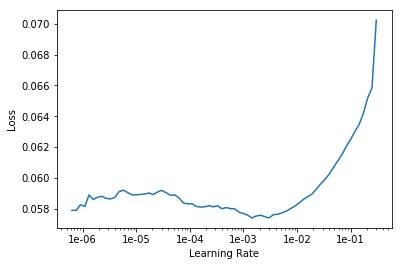

epoch,train_loss,valid_loss,lwlrap,time
0,0.056604,0.023484,0.811862,00:18
1,0.055824,0.023179,0.821491,00:17
2,0.055727,0.023649,0.820743,00:17
3,0.055610,0.023286,0.813921,00:17
4,0.055363,0.024015,0.816151,00:17
5,0.055419,0.023756,0.816400,00:17
6,0.055244,0.023944,0.819504,00:17
7,0.054968,0.023840,0.810626,00:17
8,0.054976,0.023633,0.825156,00:17
9,0.054969,0.023567,0.815957,00:18


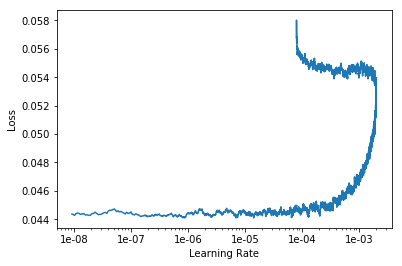

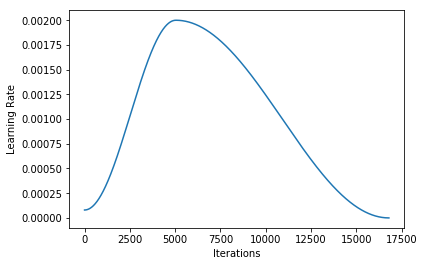

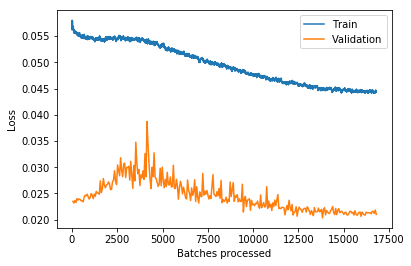

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED+NOISY - Fold 2/10 ----------------------------------------


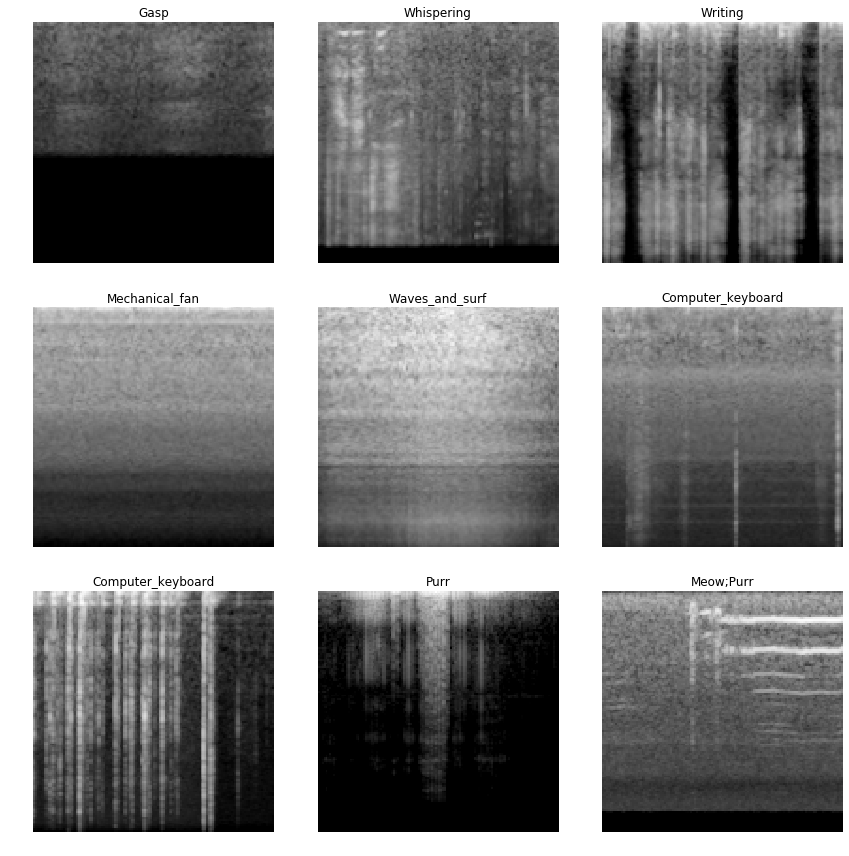

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


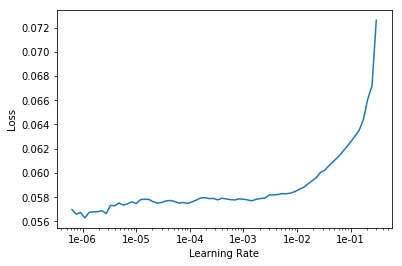

epoch,train_loss,valid_loss,lwlrap,time
0,0.056707,0.023416,0.821857,00:17
1,0.056648,0.024257,0.811793,00:17
2,0.056150,0.024614,0.816326,00:17
3,0.055908,0.023577,0.828864,00:17
4,0.055853,0.024340,0.818745,00:17
5,0.055869,0.024293,0.820242,00:17
6,0.055157,0.024842,0.822522,00:17
7,0.055096,0.025487,0.816613,00:17
8,0.055041,0.024343,0.824565,00:17
9,0.055022,0.024713,0.811780,00:17


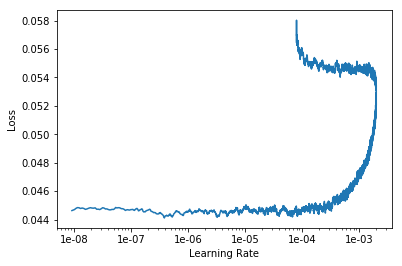

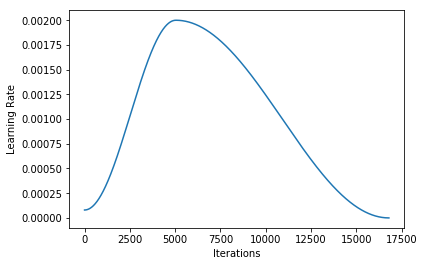

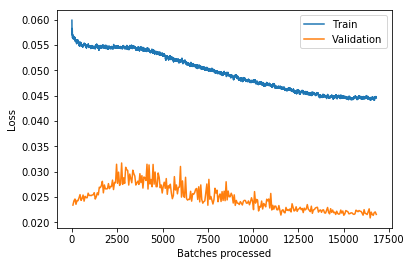

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED+NOISY - Fold 3/10 ----------------------------------------


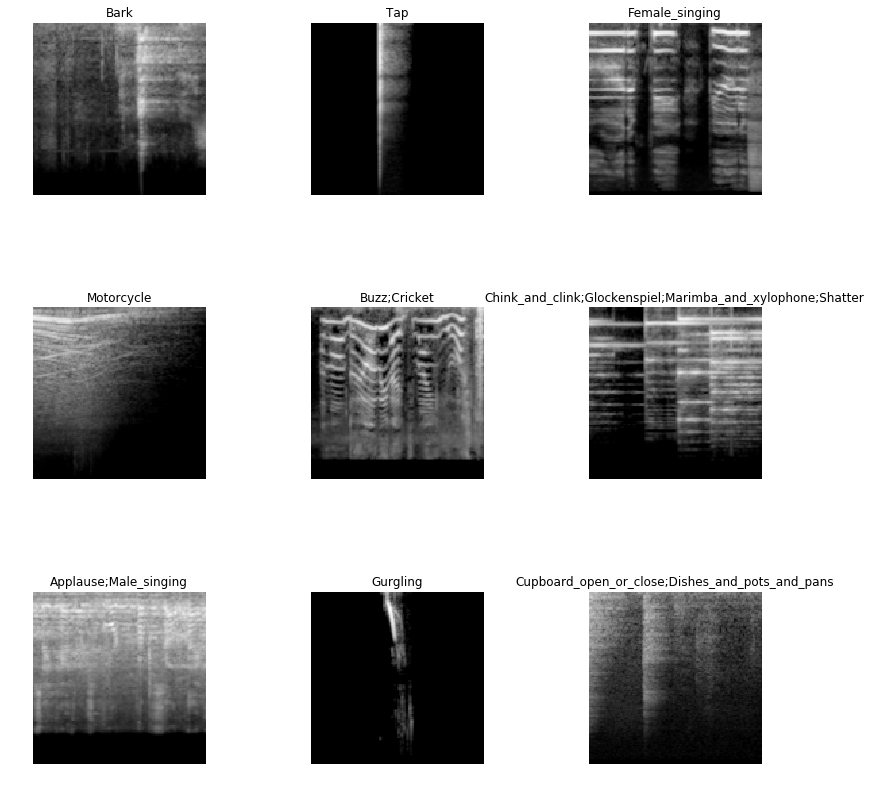

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


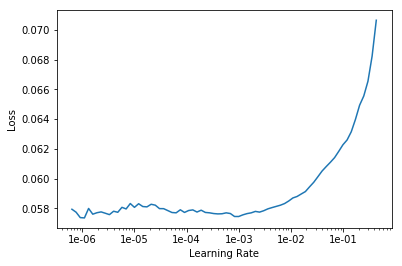

epoch,train_loss,valid_loss,lwlrap,time
0,0.057502,0.023360,0.818330,00:17
1,0.057100,0.024247,0.818254,00:17
2,0.056134,0.025028,0.808396,00:17
3,0.055889,0.025061,0.799858,00:17
4,0.055740,0.024668,0.804790,00:17
5,0.055769,0.024974,0.811054,00:17
6,0.055336,0.024759,0.805660,00:17
7,0.055091,0.025346,0.805887,00:17
8,0.055481,0.024860,0.805014,00:17
9,0.055119,0.024897,0.804919,00:17


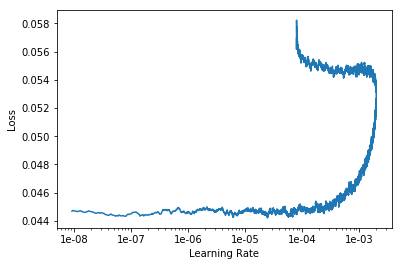

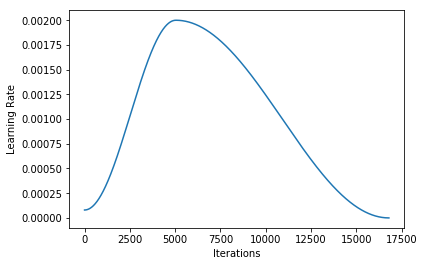

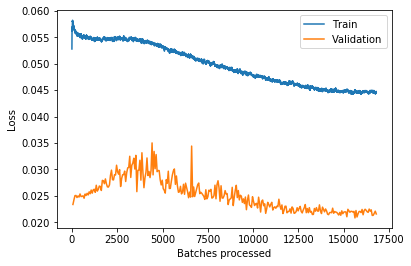

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED+NOISY - Fold 4/10 ----------------------------------------


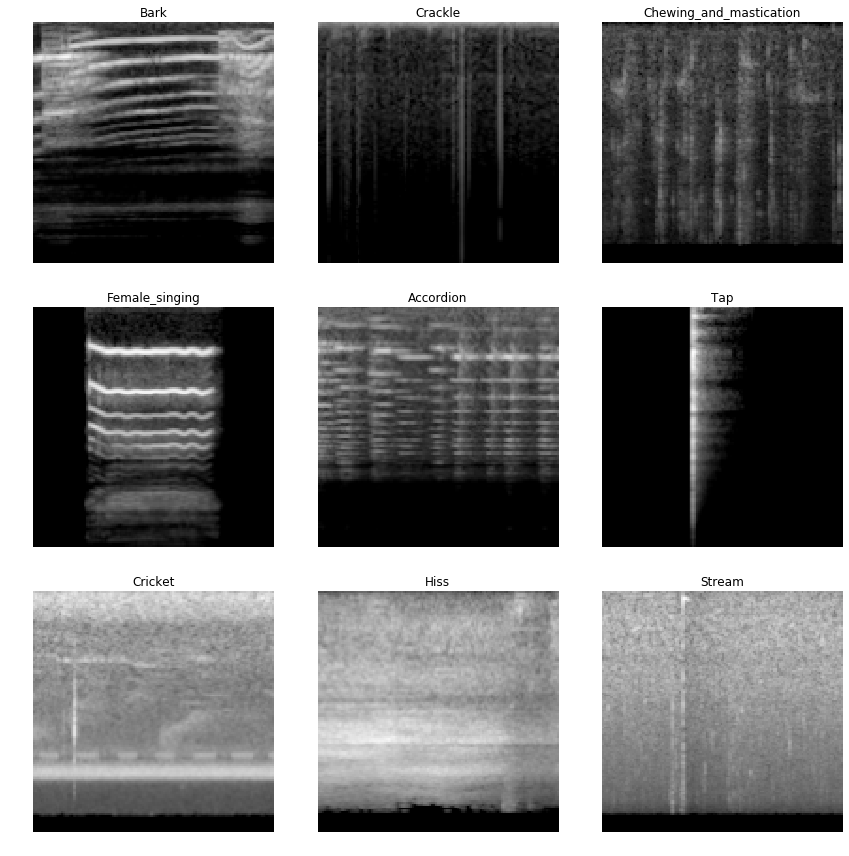

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


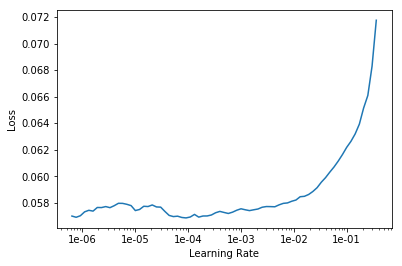

epoch,train_loss,valid_loss,lwlrap,time
0,0.057186,0.022306,0.824730,00:17
1,0.056248,0.023357,0.812927,00:17
2,0.056218,0.024014,0.812432,00:17
3,0.055755,0.024223,0.813763,00:17
4,0.055759,0.023448,0.821557,00:17
5,0.055774,0.024510,0.806825,00:17
6,0.055508,0.024389,0.814173,00:17
7,0.055471,0.025028,0.801672,00:17
8,0.055264,0.024518,0.813174,00:17
9,0.055203,0.024290,0.812464,00:17


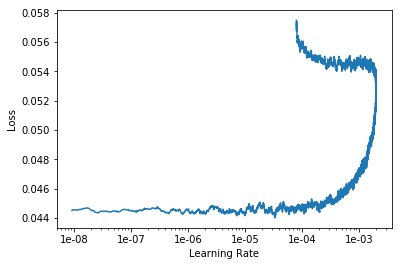

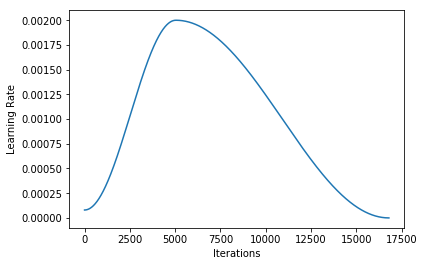

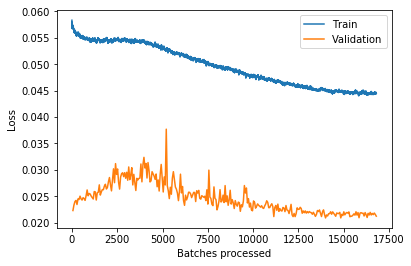

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED+NOISY - Fold 5/10 ----------------------------------------


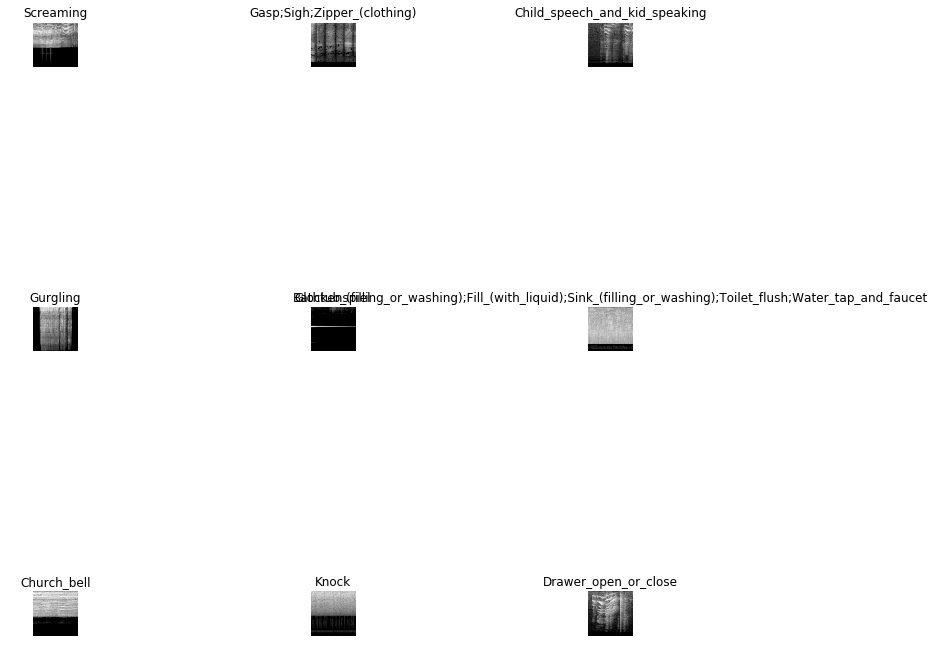

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


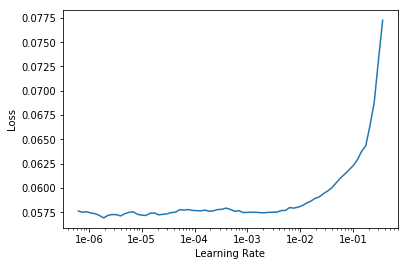

epoch,train_loss,valid_loss,lwlrap,time
0,0.057044,0.024161,0.819230,00:17
1,0.056628,0.023958,0.830739,00:17
2,0.056272,0.024250,0.821069,00:17
3,0.056022,0.024125,0.831095,00:17
4,0.055452,0.024302,0.829438,00:17
5,0.055468,0.024866,0.817254,00:17
6,0.055357,0.024041,0.839131,00:17
7,0.055482,0.024264,0.832108,00:17
8,0.055228,0.024438,0.819041,00:17
9,0.055088,0.024613,0.827360,00:17


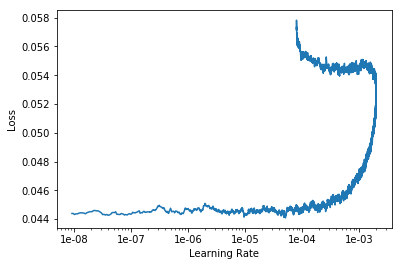

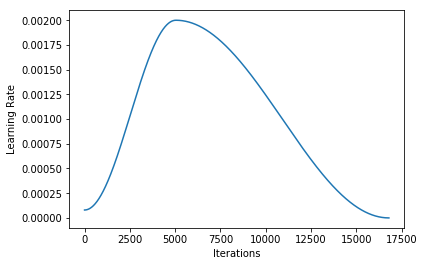

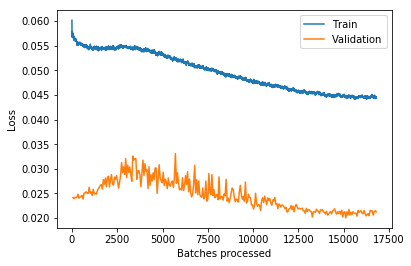

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED+NOISY - Fold 6/10 ----------------------------------------


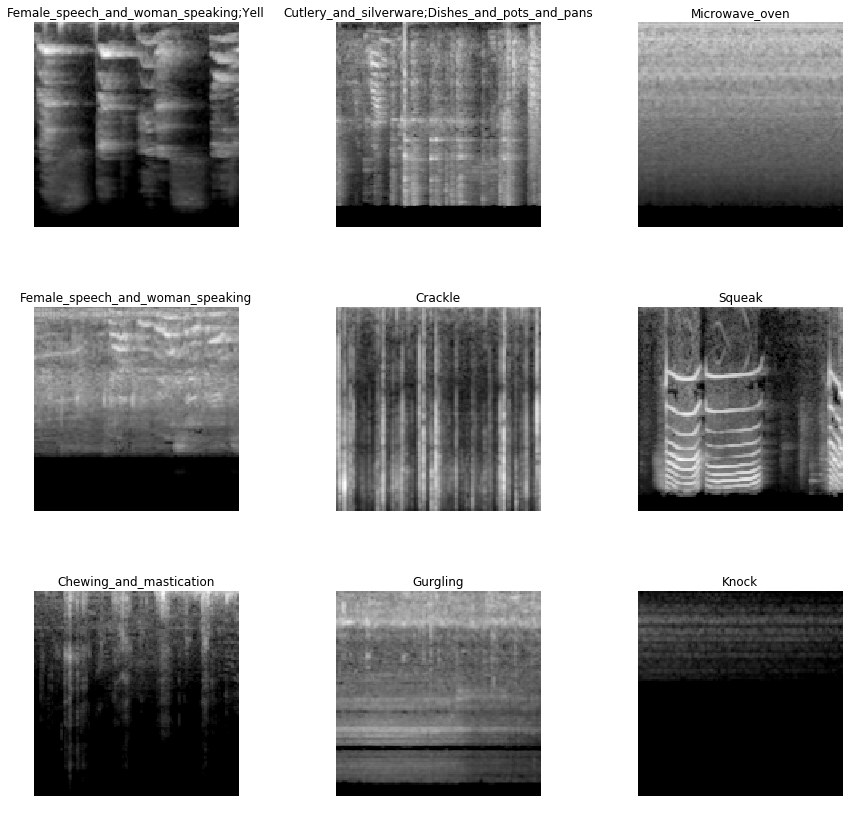

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


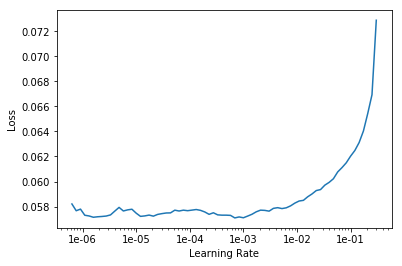

epoch,train_loss,valid_loss,lwlrap,time
0,0.056882,0.022539,0.837351,00:17
1,0.056334,0.022753,0.834765,00:17
2,0.056070,0.022571,0.839513,00:17
3,0.055645,0.022225,0.839605,00:17
4,0.055457,0.022675,0.834350,00:17
5,0.055283,0.023741,0.826357,00:17
6,0.055228,0.022678,0.833135,00:17
7,0.055197,0.022823,0.831195,00:17
8,0.055075,0.023058,0.835461,00:17
9,0.054570,0.023381,0.827844,00:17


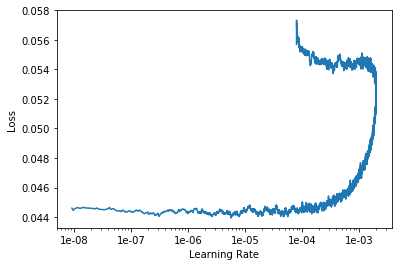

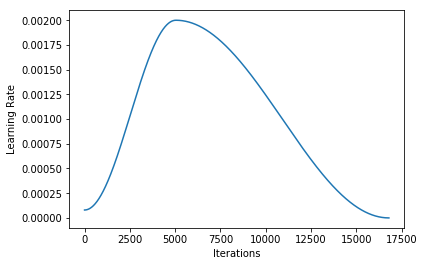

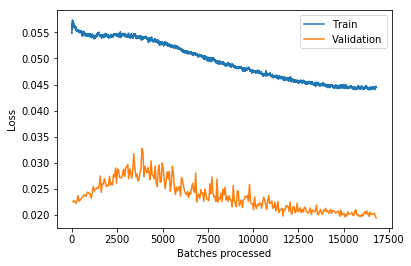

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED+NOISY - Fold 7/10 ----------------------------------------


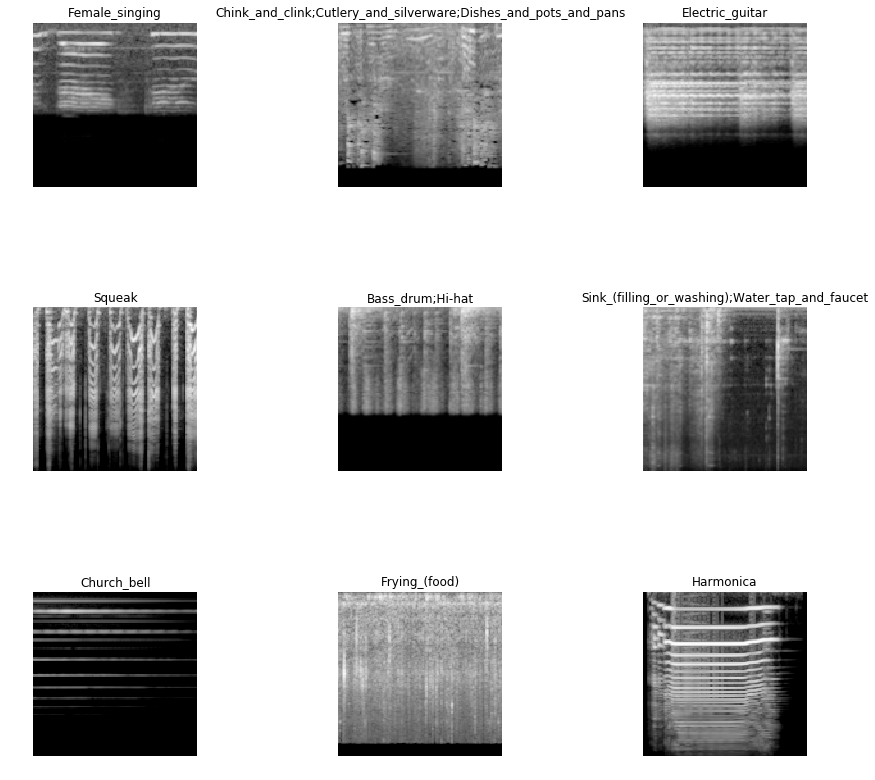

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


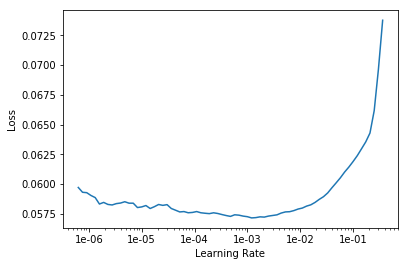

epoch,train_loss,valid_loss,lwlrap,time
0,0.057316,0.022329,0.841667,00:17
1,0.056535,0.023391,0.831719,00:17
2,0.056074,0.023455,0.823810,00:17
3,0.055881,0.022588,0.841351,00:17
4,0.055549,0.023377,0.840897,00:17
5,0.055516,0.023153,0.847745,00:17
6,0.055425,0.023215,0.836914,00:17
7,0.055237,0.022940,0.840258,00:17
8,0.054918,0.023720,0.831887,00:18
9,0.055017,0.023964,0.837969,00:17


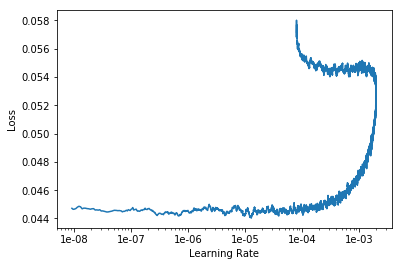

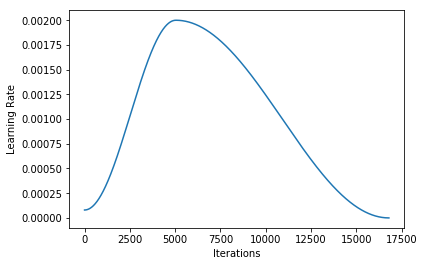

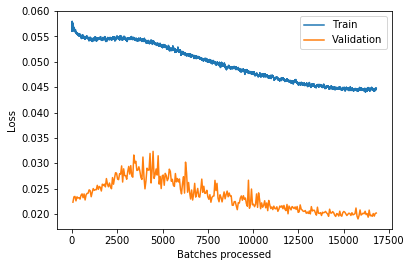

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED+NOISY - Fold 8/10 ----------------------------------------


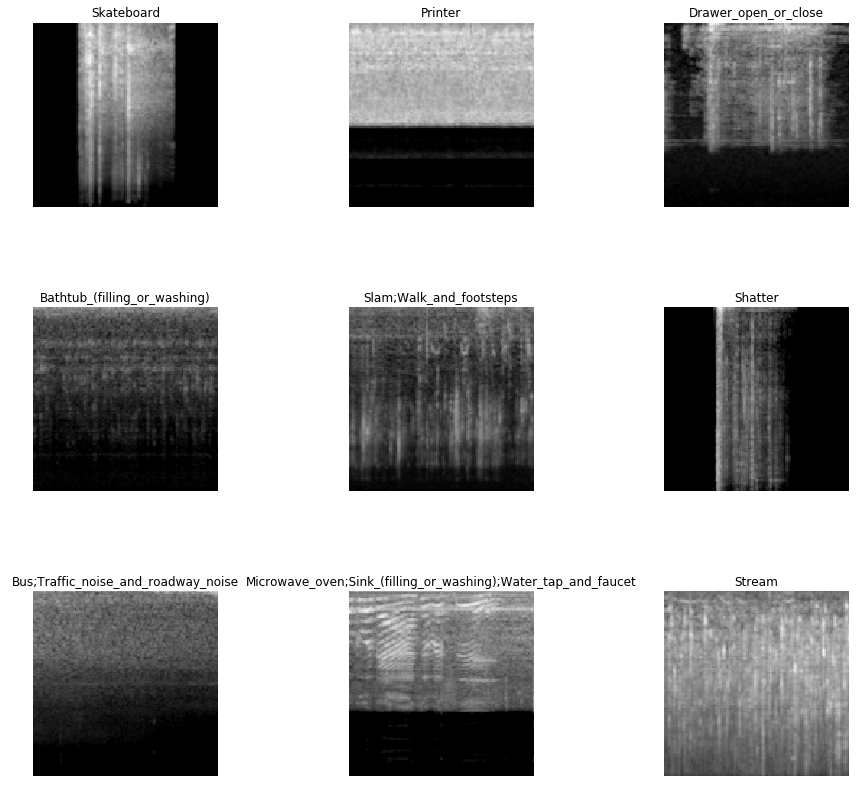

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


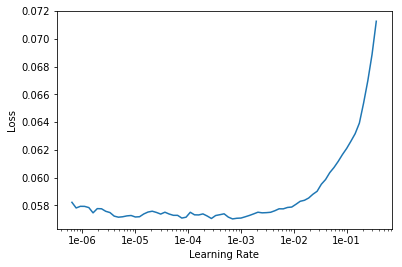

epoch,train_loss,valid_loss,lwlrap,time
0,0.056809,0.025170,0.807519,00:17
1,0.056327,0.024499,0.817057,00:17
2,0.055843,0.024902,0.816686,00:17
3,0.055242,0.024197,0.827524,00:17
4,0.055342,0.024830,0.822752,00:17
5,0.055212,0.024952,0.817645,00:17
6,0.055107,0.025292,0.812336,00:17
7,0.055026,0.025106,0.814816,00:17
8,0.055015,0.025701,0.814898,00:17
9,0.054879,0.025290,0.815145,00:17


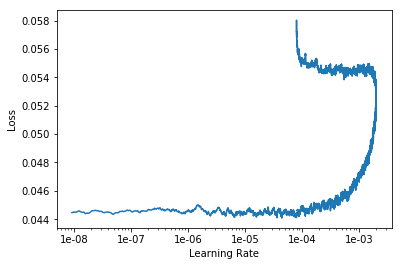

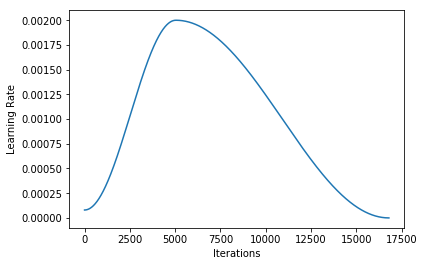

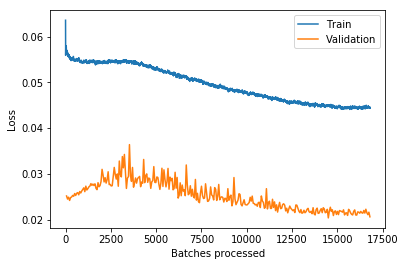

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED+NOISY - Fold 9/10 ----------------------------------------


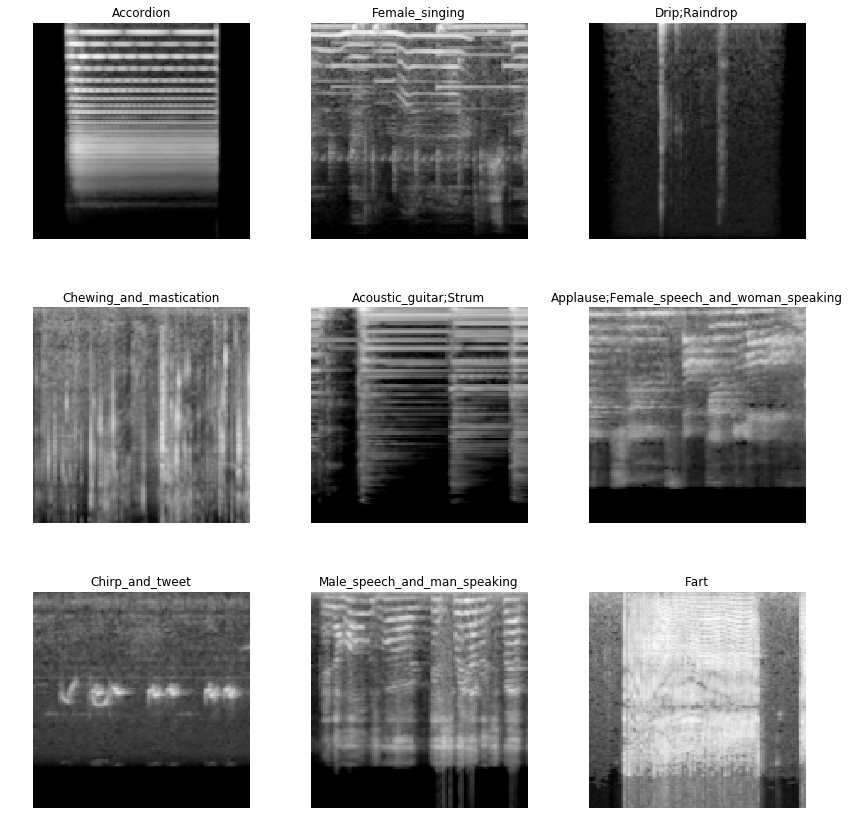

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


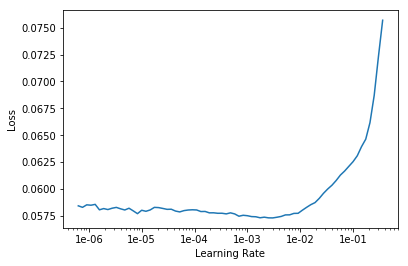

epoch,train_loss,valid_loss,lwlrap,time
0,0.057248,0.023055,0.828958,00:17
1,0.056265,0.022653,0.831030,00:17
2,0.055987,0.023141,0.832521,00:17
3,0.055700,0.022988,0.828120,00:17
4,0.055641,0.022968,0.835475,00:17
5,0.055514,0.023106,0.835262,00:17
6,0.055331,0.022630,0.841995,00:17
7,0.055034,0.023878,0.820424,00:17
8,0.055080,0.022898,0.842762,00:17
9,0.054952,0.024086,0.826223,00:17


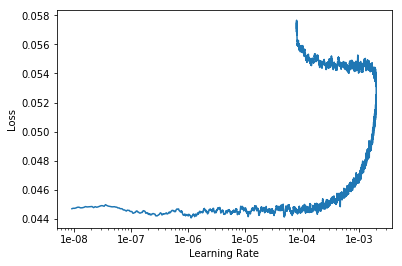

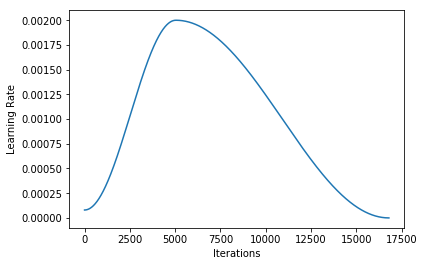

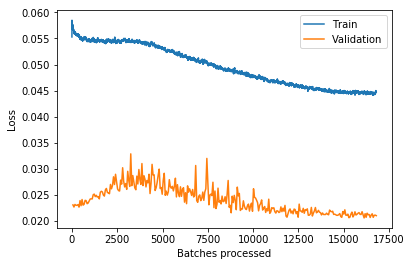

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED+NOISY - Fold 10/10 ----------------------------------------


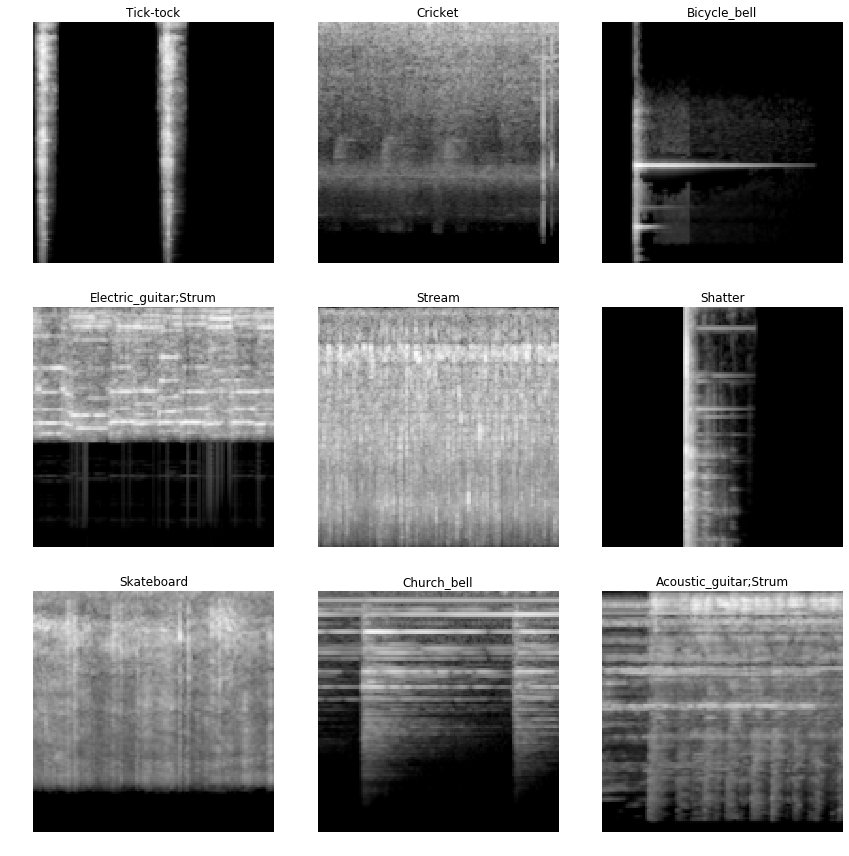

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


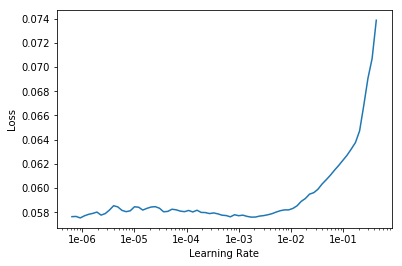

epoch,train_loss,valid_loss,lwlrap,time
0,0.056944,0.023557,0.823789,00:17
1,0.056377,0.024361,0.811401,00:17
2,0.055647,0.023597,0.828464,00:17
3,0.055584,0.023055,0.831785,00:17
4,0.055571,0.023412,0.827034,00:17
5,0.055190,0.024311,0.820489,00:17
6,0.055063,0.024603,0.815311,00:17
7,0.055407,0.024187,0.817767,00:17
8,0.055407,0.024219,0.822831,00:17
9,0.055089,0.024656,0.822588,00:17


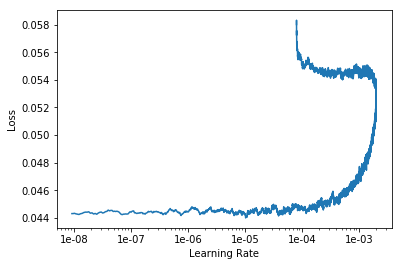

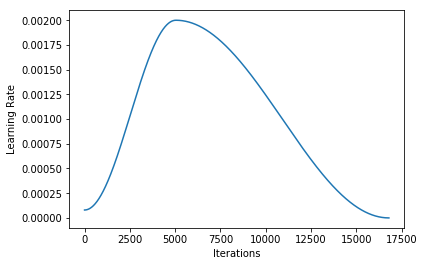

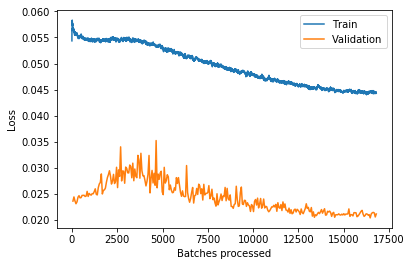

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [70]:
for fold, ((train_index1, valid_index1), (train_index2, valid_index2)) in enumerate(zip(kf_curated.split(trn_curated_df), kf_noisy.split(trn_noisy_df))):
    print('-' * 40, f'CURATED+NOISY - Fold {fold+1}/{n_splits}', '-' * 40)

    train_index2 = list(set(train_index2).intersection(set(ok_noisy_items)))
    
    mix_df = pd.concat([
        trn_curated_df.iloc[train_index1],
        trn_noisy_df.iloc[train_index2],
        trn_curated_df.iloc[valid_index1],
#         trn_noisy_df.iloc[valid_index2],  # compute lwlrap only on curated
    ], ignore_index=True)
    train_index = mix_df[:len(train_index1)+len(train_index2)].index
    valid_index = mix_df[len(train_index1)+len(train_index2):].index

    
    src = (ImageList.from_df(mix_df, WORK)
           .split_by_idxs(train_index, valid_index)
           .label_from_df(label_delim=',')
    )
    data = (src.transform(tfms, size=128)
            .databunch(bs=bs)
    )
    data.show_batch(3)
    plt.show()
    
    learn.load(f'stage-2_fold-{fold}')
    learn.data = data

#     learning(learn, 100, 1e-2)
    learning(learn, 300, 2e-3)
    
    learn.save(f'stage-10_fold-{fold}')
    learn.export(f'stage-10_fold-{fold}.pkl')
    
    if TOY_MODE:
        break

In [71]:
kfold_lwlrap('CURATED', kf_curated, trn_curated_df, 'stage-10_fold-{fold}')

Overall lwlrap on CURATED dataset: 0.8792998601729842


,lwlrap,weight
Fill_(with_liquid),0.612078,0.008693
Squeak,0.648857,0.013039
Walk_and_footsteps,0.676538,0.013039
Mechanical_fan,0.718587,0.008519
Tap,0.730889,0.013039
Chink_and_clink,0.743390,0.013039
Hiss,0.747537,0.013039
Cutlery_and_silverware,0.778966,0.013039
Frying_(food),0.782194,0.010953
Buzz,0.792114,0.009736


In [72]:
kfold_lwlrap('NOISY', kf_noisy, trn_noisy_df, 'stage-10_fold-{fold}')

Overall lwlrap on NOISY dataset: 0.5671609663778308


,lwlrap,weight
Burping_and_eructation,0.144436,0.0125
Cupboard_open_or_close,0.172749,0.0125
Finger_snapping,0.191994,0.0125
Raindrop,0.247609,0.0125
Keys_jangling,0.247799,0.0125
Sigh,0.264568,0.0125
Shatter,0.264755,0.0125
Fart,0.273453,0.0125
Zipper_(clothing),0.276470,0.0125
Tap,0.308443,0.0125


In [108]:
def lwlrap_per_sample(fname, kf, df):
    overall_preds, overall_thruth, overall_index = _kfold_prediction(kf, df, fname)
    
    m = pd.DataFrame(
        [_one_sample_positive_class_precisions(p, t)[1].mean() for i, (p, t) in enumerate(zip(overall_preds, overall_thruth))],
        columns=['lwlrap'],
        index=overall_index
    )
    
    m[['fname', 'labels']] = df[['fname', 'labels']]

    return m.sort_values('lwlrap', ascending=False)

In [109]:
m4 = lwlrap_per_sample('stage-10_fold-{fold}', kf_noisy, trn_noisy_df)

In [110]:
m4

,lwlrap,fname,labels
19798,1.000000,ffd7d1fe.wav,Applause
19561,1.000000,fc631546.wav,Male_speech_and_man_speaking
3951,1.000000,327f4ab3.wav,"Female_speech_and_woman_speaking,Applause"
3976,1.000000,32cfcd1a.wav,Accordion
19609,1.000000,fd0411df.wav,Tap
3992,1.000000,32fa6d6a.wav,Applause
4028,1.000000,336df3ed.wav,"Motorcycle,Traffic_noise_and_roadway_noise"
4034,1.000000,338f1a0b.wav,Trickle_and_dribble
19558,1.000000,fc455cfe.wav,Acoustic_guitar
4110,1.000000,34b97903.wav,Male_speech_and_man_speaking


In [116]:
(m4.lwlrap < .5).sum(), (m4.lwlrap >= .5).sum(), (m4.lwlrap == 1).sum()

(8581, 11234, 7981)

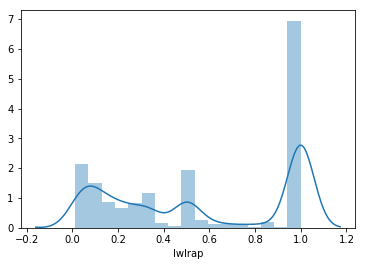

In [123]:
sns.distplot(m4.lwlrap);

In [124]:
ok_noisy_items2 = m4[m4.lwlrap == 1].index
len(ok_noisy_items2)

7981

---------------------------------------- CURATED+NOISY+2 - Fold 1/10 ----------------------------------------


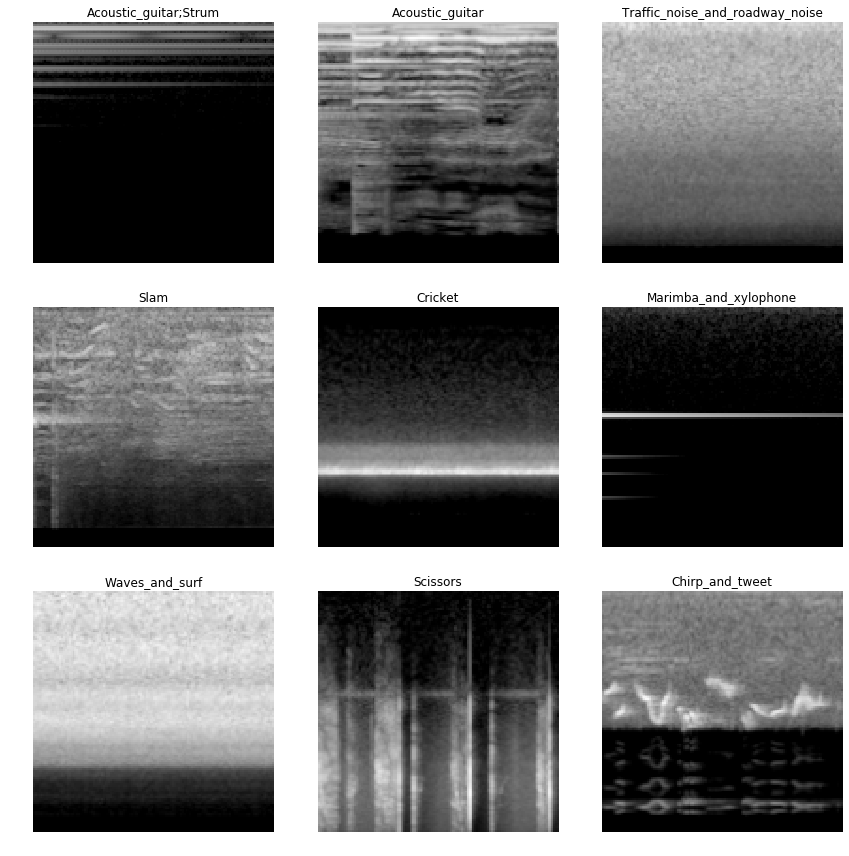

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


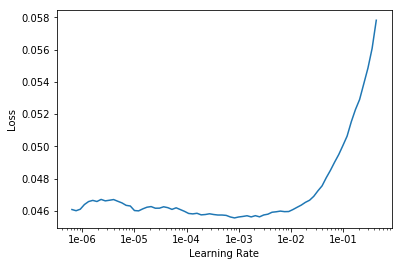

epoch,train_loss,valid_loss,lwlrap,time
0,0.045100,0.021470,0.838579,00:27
1,0.044601,0.021310,0.829119,00:26
2,0.044545,0.021357,0.840019,00:26
3,0.044782,0.022040,0.834100,00:26
4,0.044891,0.022975,0.823205,00:27
5,0.045007,0.024228,0.816506,00:27
6,0.045211,0.023376,0.818554,00:27
7,0.045713,0.026815,0.775371,00:25
8,0.046147,0.023903,0.813561,00:25
9,0.046387,0.026452,0.789482,00:25


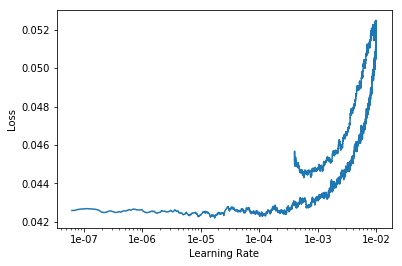

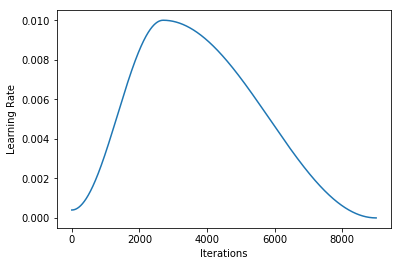

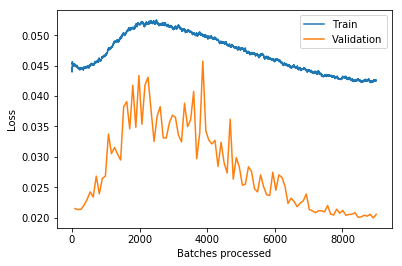

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED+NOISY+2 - Fold 2/10 ----------------------------------------


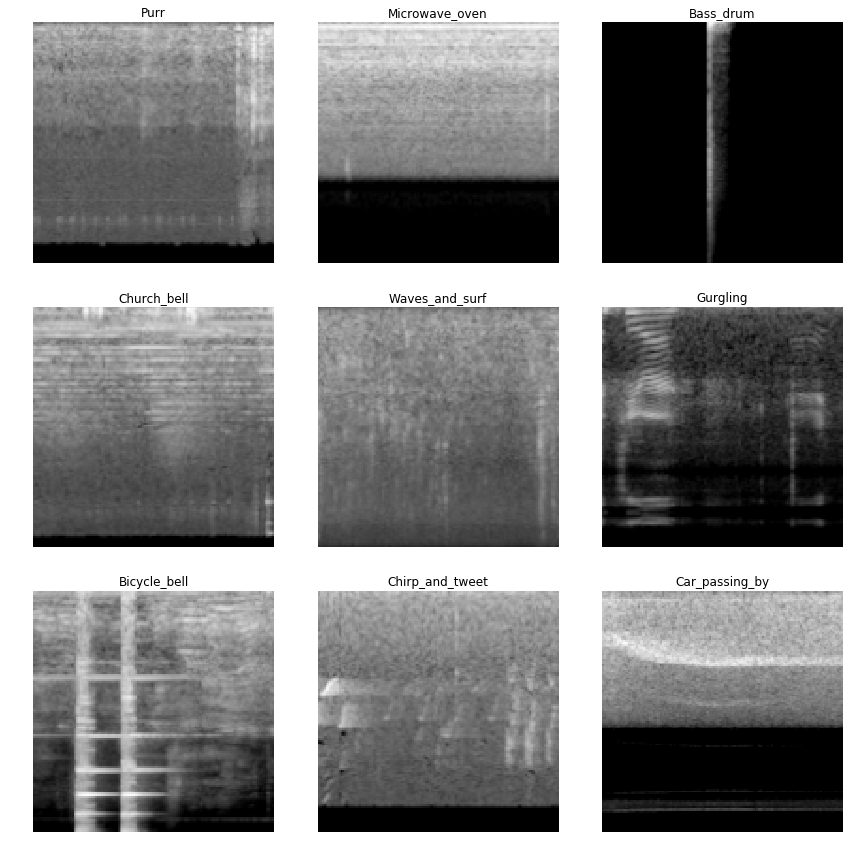

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


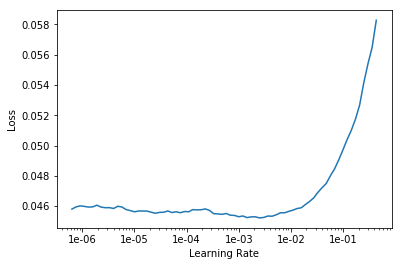

epoch,train_loss,valid_loss,lwlrap,time
0,0.045213,0.021607,0.830264,00:25
1,0.044984,0.021602,0.838019,00:26
2,0.044675,0.023301,0.815386,00:25
3,0.044534,0.022808,0.825725,00:25
4,0.044433,0.023463,0.816815,00:25
5,0.045037,0.023090,0.817090,00:25
6,0.045081,0.024431,0.807810,00:25
7,0.045585,0.023809,0.816962,00:25
8,0.045829,0.026857,0.781265,00:25
9,0.046290,0.026912,0.794355,00:25


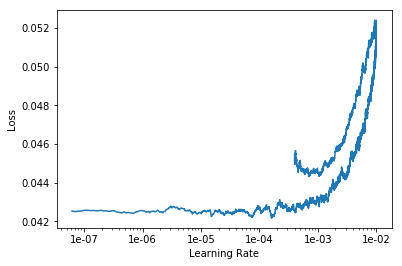

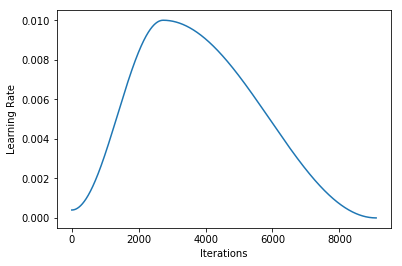

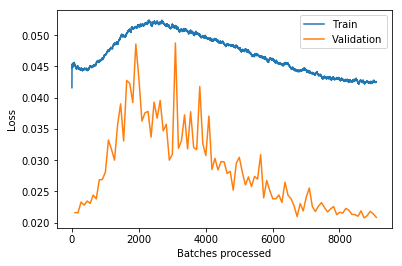

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED+NOISY+2 - Fold 3/10 ----------------------------------------


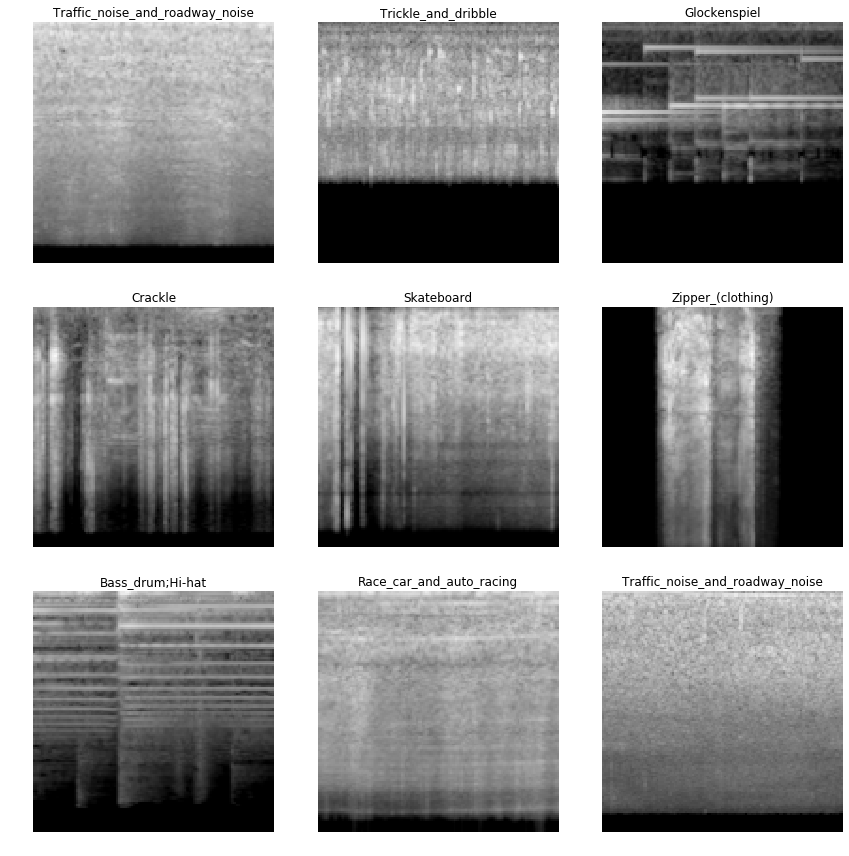

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


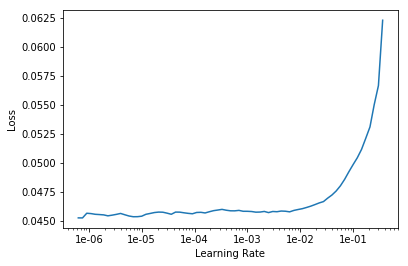

epoch,train_loss,valid_loss,lwlrap,time
0,0.044810,0.021927,0.832009,00:25
1,0.044830,0.021930,0.828242,00:25
2,0.044544,0.022750,0.813221,00:25
3,0.044608,0.023198,0.825139,00:25
4,0.044770,0.024439,0.801027,00:25
5,0.045114,0.023799,0.815405,00:25
6,0.045373,0.024665,0.806384,00:25
7,0.045485,0.026328,0.792087,00:25
8,0.045982,0.027379,0.770572,00:25
9,0.046758,0.025664,0.793724,00:25


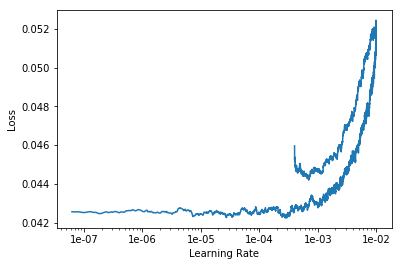

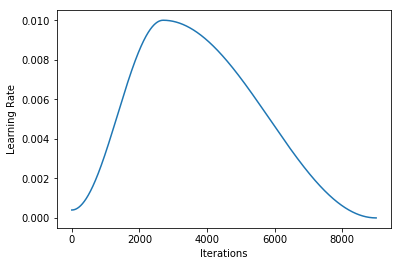

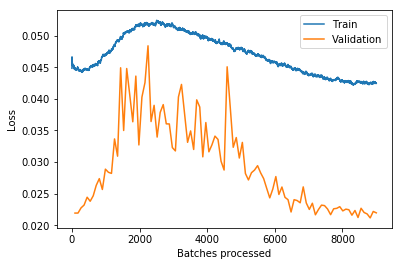

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED+NOISY+2 - Fold 4/10 ----------------------------------------


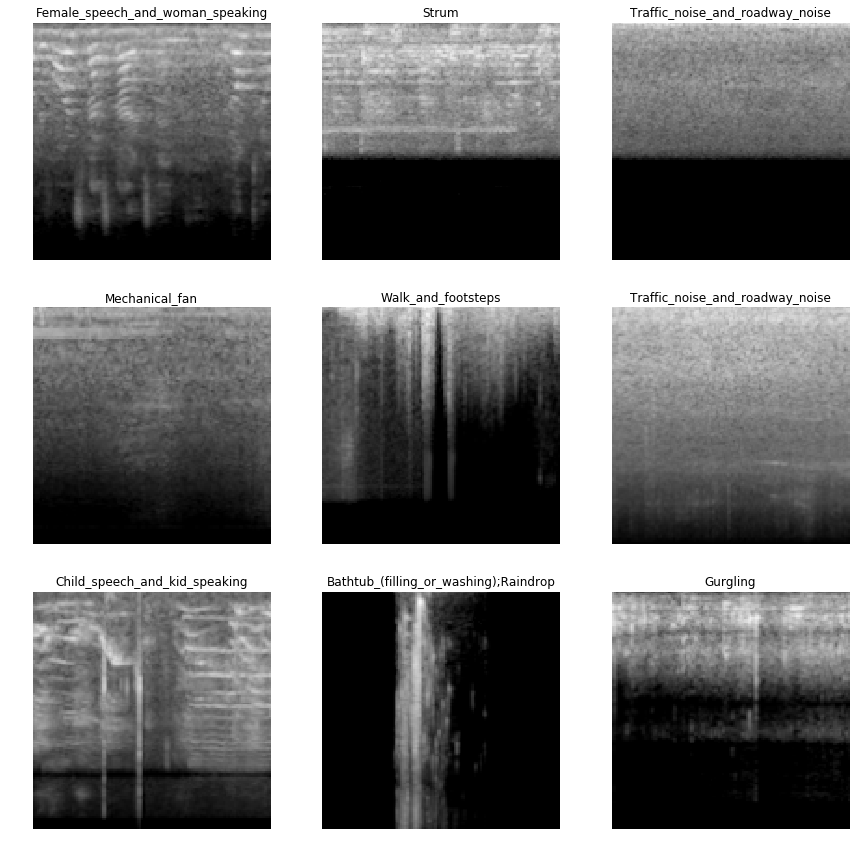

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


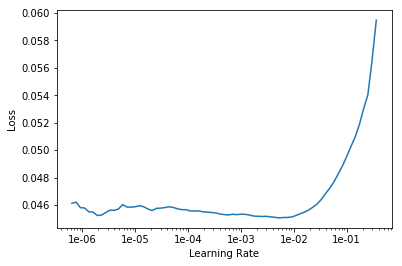

epoch,train_loss,valid_loss,lwlrap,time
0,0.045247,0.022581,0.820164,00:25
1,0.044779,0.022697,0.828605,00:25
2,0.044696,0.022430,0.825033,00:25
3,0.044629,0.022135,0.823214,00:25
4,0.045060,0.022292,0.835347,00:25
5,0.044883,0.021687,0.829611,00:25
6,0.045365,0.024743,0.801705,00:25
7,0.045463,0.024758,0.808124,00:25
8,0.046008,0.025780,0.798363,00:25
9,0.046553,0.026947,0.776240,00:25


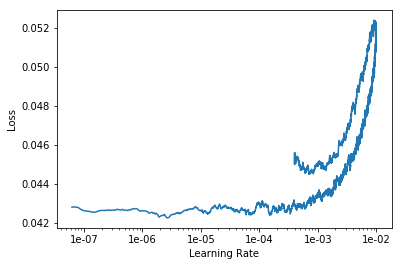

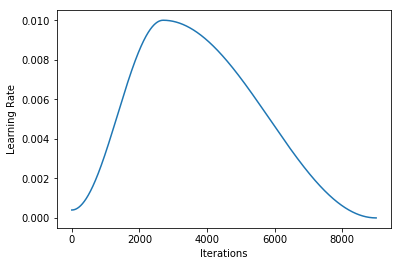

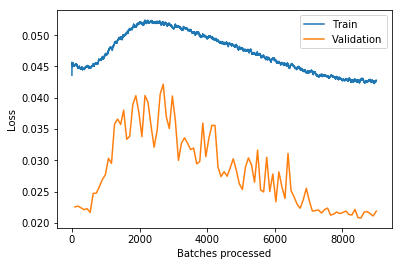

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED+NOISY+2 - Fold 5/10 ----------------------------------------


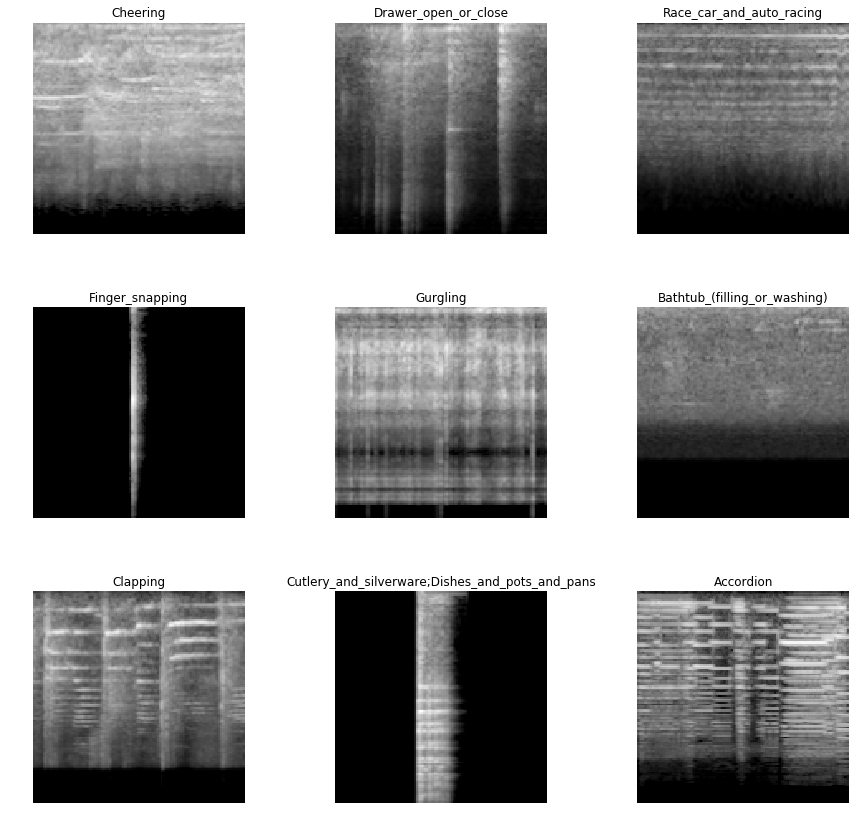

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


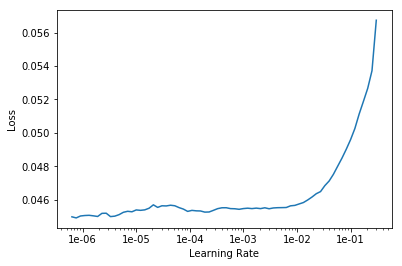

epoch,train_loss,valid_loss,lwlrap,time
0,0.044952,0.021348,0.860392,00:25
1,0.044910,0.022858,0.844565,00:25
2,0.044635,0.022177,0.844344,00:25
3,0.044656,0.022334,0.834913,00:25
4,0.044752,0.022382,0.843901,00:25
5,0.044839,0.023134,0.831639,00:25
6,0.045287,0.022595,0.845363,00:25
7,0.045670,0.024075,0.825879,00:25
8,0.046078,0.028216,0.774827,00:25
9,0.046577,0.026030,0.804676,00:25


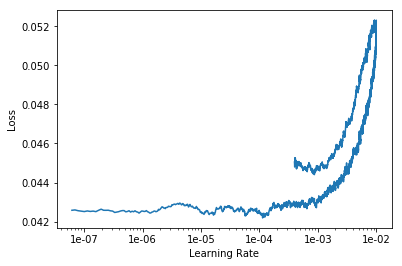

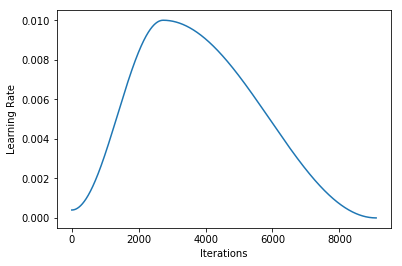

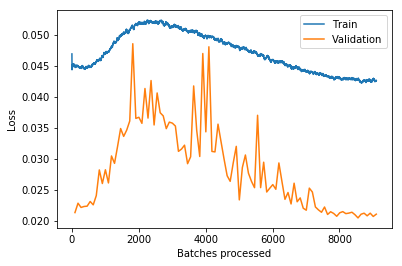

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED+NOISY+2 - Fold 6/10 ----------------------------------------


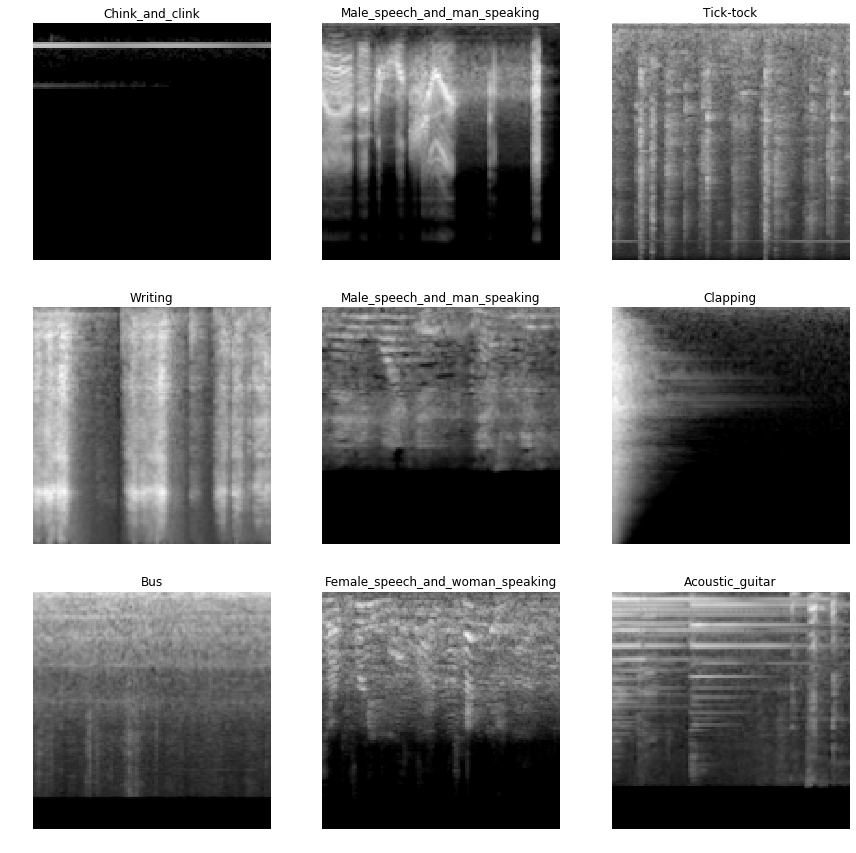

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


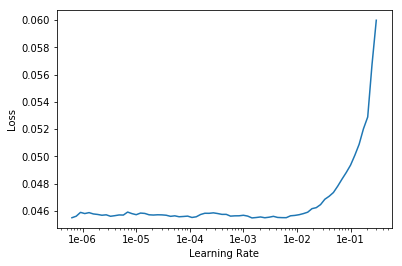

epoch,train_loss,valid_loss,lwlrap,time
0,0.045087,0.021009,0.842633,00:25
1,0.044685,0.020424,0.851296,00:25
2,0.044517,0.020458,0.854397,00:25
3,0.044481,0.020694,0.850244,00:25
4,0.044849,0.021231,0.847346,00:25
5,0.044783,0.023296,0.821920,00:25
6,0.044990,0.023048,0.813183,00:25
7,0.045531,0.026824,0.776833,00:25
8,0.046085,0.023432,0.817616,00:25
9,0.046644,0.024874,0.813148,00:25


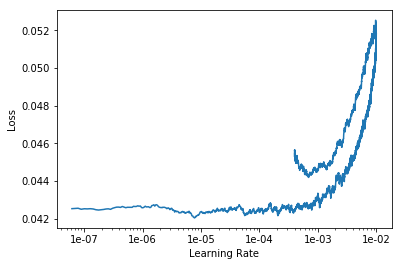

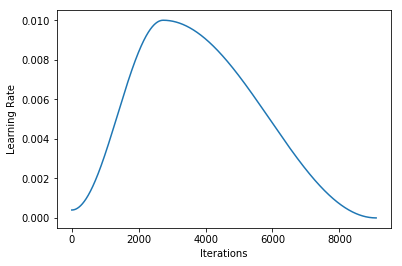

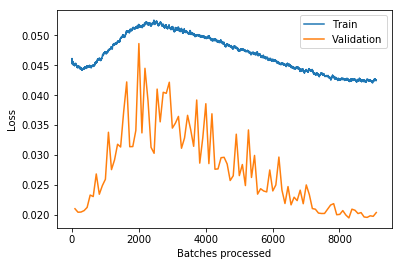

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED+NOISY+2 - Fold 7/10 ----------------------------------------


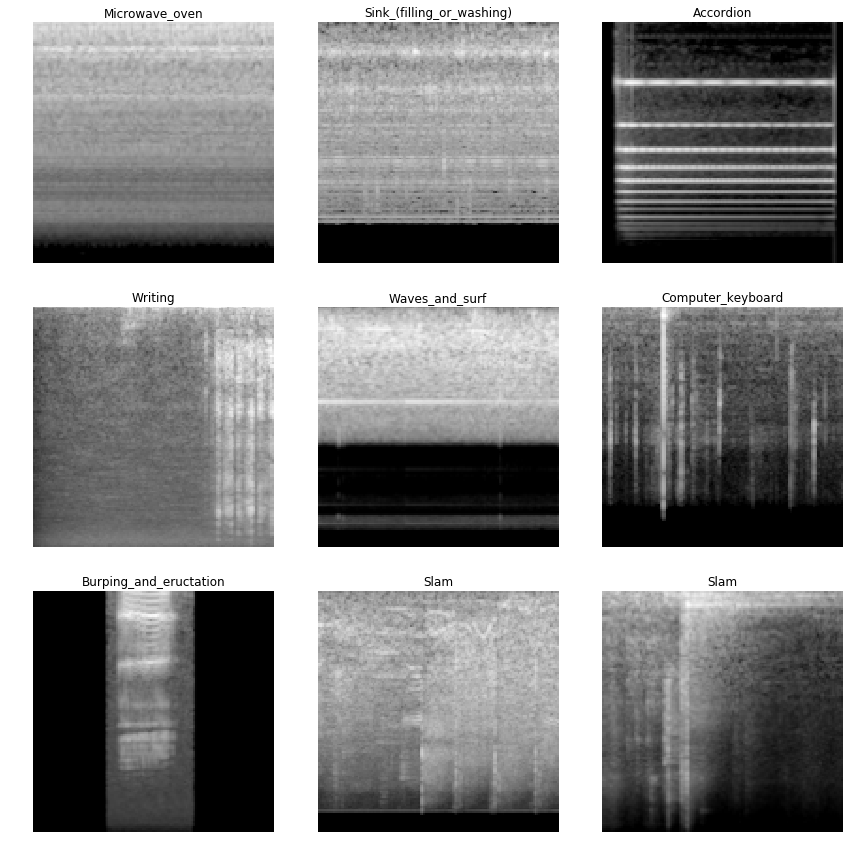

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


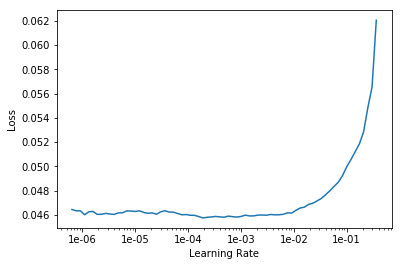

epoch,train_loss,valid_loss,lwlrap,time
0,0.045329,0.020936,0.858026,00:25
1,0.044764,0.020994,0.867423,00:25
2,0.044909,0.020625,0.855844,00:25
3,0.044785,0.021293,0.857766,00:25
4,0.044639,0.021398,0.841620,00:25
5,0.045081,0.021482,0.840105,00:25
6,0.045538,0.022920,0.827396,00:25
7,0.045632,0.026858,0.783709,00:25
8,0.045805,0.025121,0.813611,00:25
9,0.046495,0.025349,0.808950,00:25


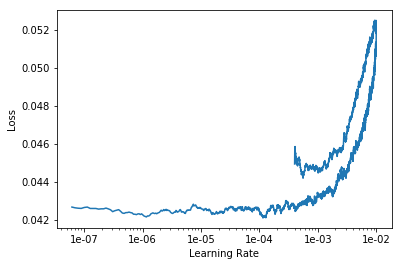

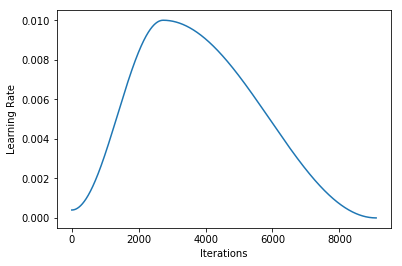

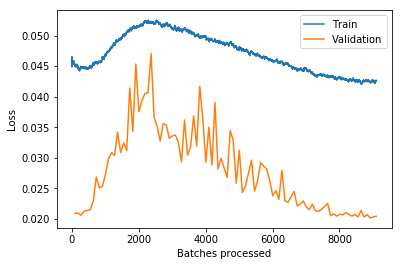

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED+NOISY+2 - Fold 8/10 ----------------------------------------


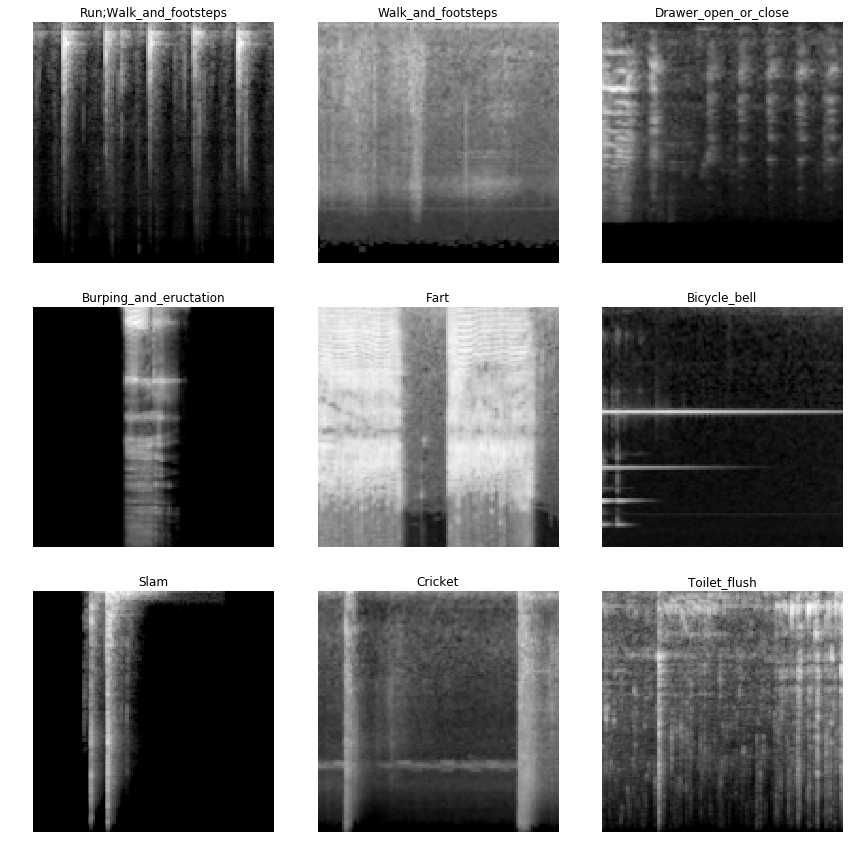

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


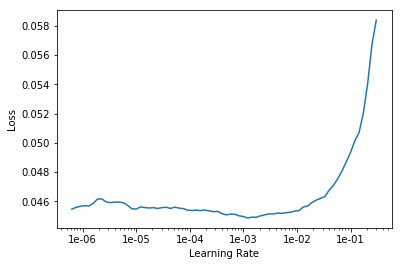

epoch,train_loss,valid_loss,lwlrap,time
0,0.045350,0.022131,0.839715,00:25
1,0.045134,0.023154,0.825232,00:25
2,0.044334,0.022236,0.840868,00:25
3,0.044522,0.023001,0.835407,00:25
4,0.044667,0.024662,0.811546,00:25
5,0.044859,0.024474,0.817020,00:25
6,0.044988,0.025426,0.804329,00:25
7,0.045664,0.025366,0.812141,00:25
8,0.045628,0.025669,0.816842,00:25
9,0.046303,0.028672,0.759739,00:25


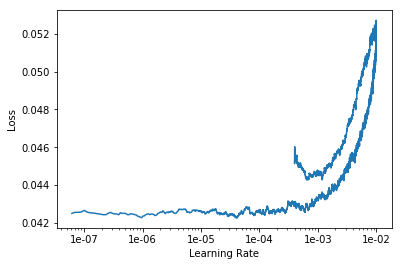

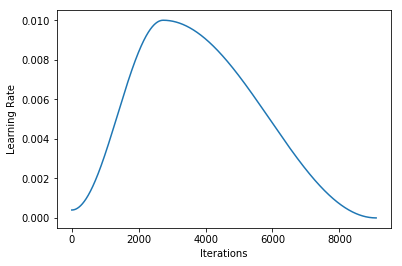

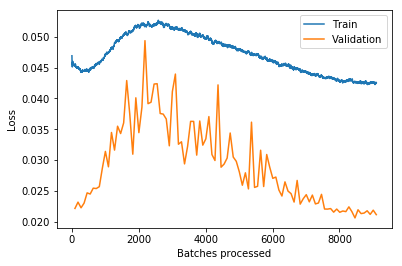

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED+NOISY+2 - Fold 9/10 ----------------------------------------


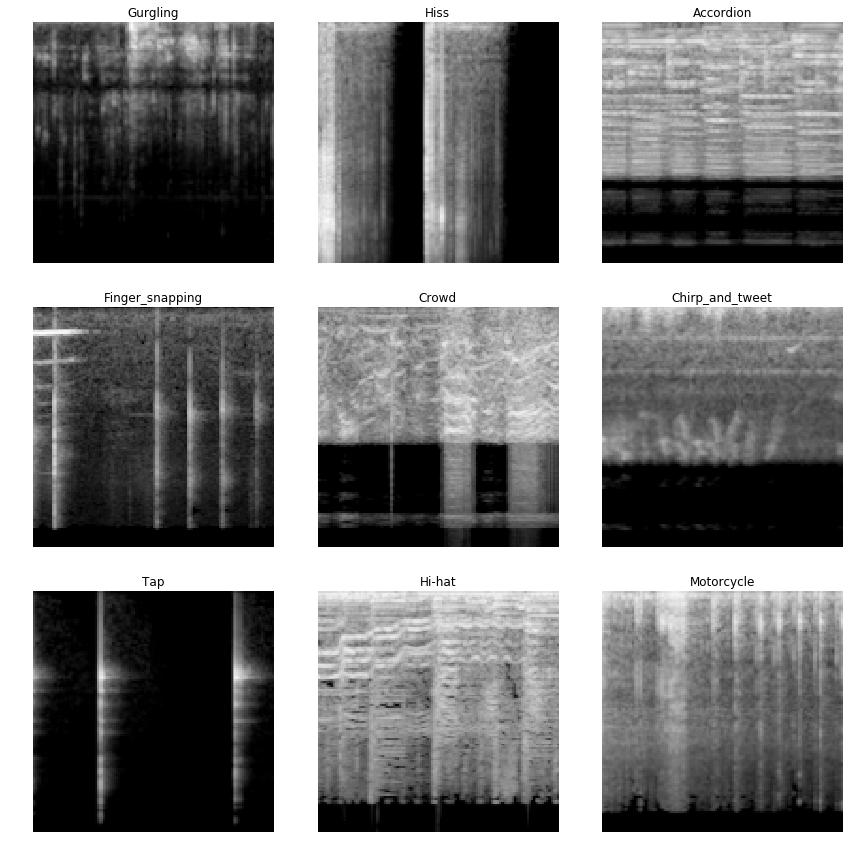

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


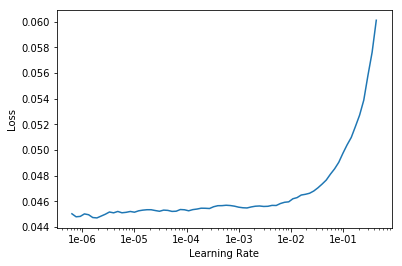

epoch,train_loss,valid_loss,lwlrap,time
0,0.044993,0.021803,0.827467,00:25
1,0.044800,0.021426,0.841152,00:25
2,0.044535,0.022355,0.836080,00:26
3,0.044658,0.022423,0.828003,00:26
4,0.045193,0.022729,0.830722,00:25
5,0.045184,0.022171,0.837914,00:25
6,0.045358,0.022818,0.832404,00:25
7,0.045625,0.024760,0.811118,00:25
8,0.046115,0.024138,0.819051,00:25
9,0.046303,0.025172,0.801480,00:25


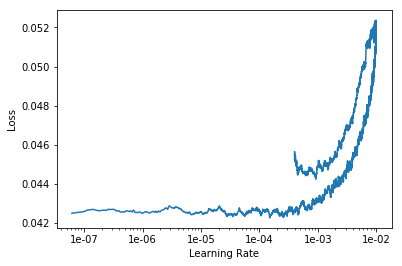

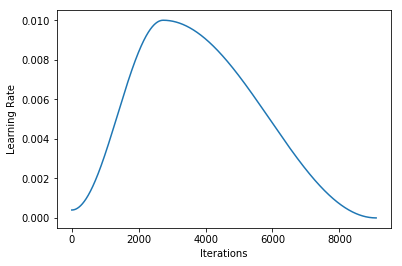

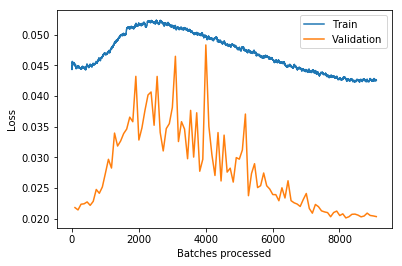

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


---------------------------------------- CURATED+NOISY+2 - Fold 10/10 ----------------------------------------


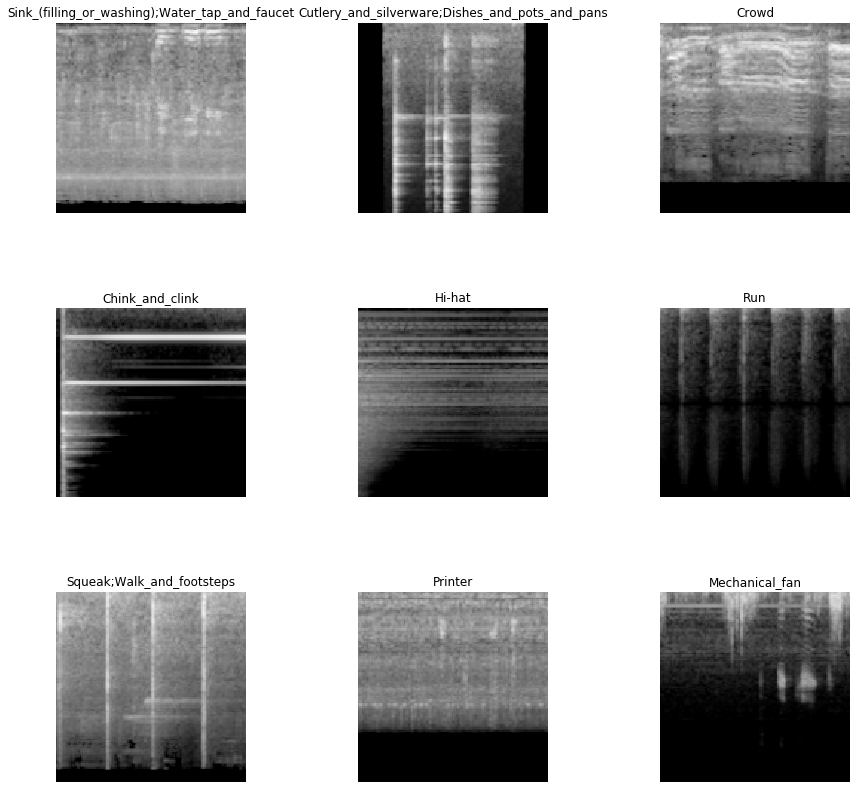

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


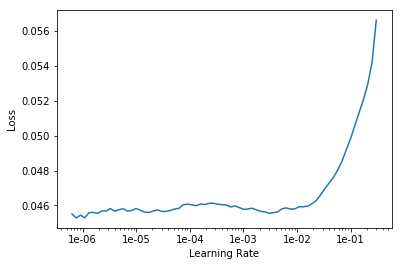

epoch,train_loss,valid_loss,lwlrap,time
0,0.045427,0.021697,0.832419,00:25
1,0.044743,0.022276,0.825660,00:25
2,0.044486,0.021780,0.832564,00:25
3,0.044756,0.022190,0.826124,00:25
4,0.045080,0.021872,0.832989,00:25
5,0.044825,0.022997,0.828090,00:25
6,0.045183,0.023768,0.819289,00:25
7,0.045506,0.024924,0.795446,00:25
8,0.046322,0.029238,0.758253,00:25
9,0.046599,0.025563,0.804177,00:25


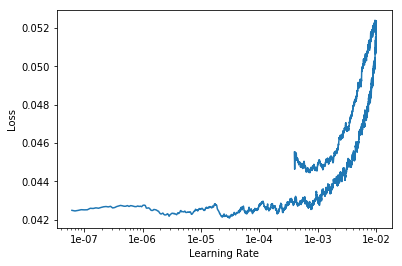

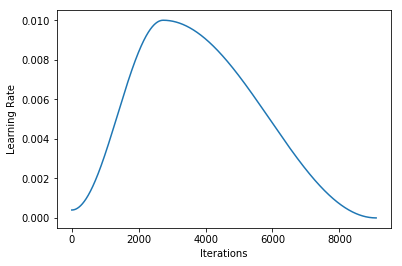

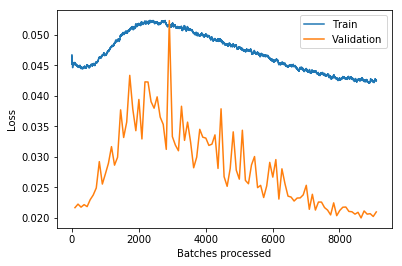

/home/eric/anaconda3/lib/python3.7/site-packages/torch/serialization.py:251: UserWarning: Couldn't retrieve source code for container of type ConvBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [125]:
for fold, ((train_index1, valid_index1), (train_index2, valid_index2)) in enumerate(zip(kf_curated.split(trn_curated_df), kf_noisy.split(trn_noisy_df))):
    print('-' * 40, f'CURATED+NOISY+2 - Fold {fold+1}/{n_splits}', '-' * 40)

    train_index2 = list(set(train_index2).intersection(set(ok_noisy_items2)))
    
    mix_df = pd.concat([
        trn_curated_df.iloc[train_index1],
        trn_noisy_df.iloc[train_index2],
        trn_curated_df.iloc[valid_index1],
#         trn_noisy_df.iloc[valid_index2],  # compute lwlrap only on curated
    ], ignore_index=True)
    train_index = mix_df[:len(train_index1)+len(train_index2)].index
    valid_index = mix_df[len(train_index1)+len(train_index2):].index

    
    src = (ImageList.from_df(mix_df, WORK)
           .split_by_idxs(train_index, valid_index)
           .label_from_df(label_delim=',')
    )
    data = (src.transform(tfms, size=128)
            .databunch(bs=bs)
    )
    data.show_batch(3)
    plt.show()
    
    learn.load(f'stage-10_fold-{fold}')
    learn.data = data

    learning(learn, 100, 1e-2)
    
    learn.save(f'stage-11_fold-{fold}')
    learn.export(f'stage-11_fold-{fold}.pkl')
    
    if TOY_MODE:
        break

In [126]:
kfold_lwlrap('CURATED', kf_curated, trn_curated_df, 'stage-11_fold-{fold}')

Overall lwlrap on CURATED dataset: 0.8771791215725213


,lwlrap,weight
Fill_(with_liquid),0.604929,0.008693
Squeak,0.633349,0.013039
Walk_and_footsteps,0.694341,0.013039
Hiss,0.722582,0.013039
Mechanical_fan,0.729417,0.008519
Buzz,0.756949,0.009736
Tap,0.763608,0.013039
Chink_and_clink,0.767967,0.013039
Bus,0.768223,0.013039
Yell,0.771113,0.013039


In [127]:
kfold_lwlrap('NOISY', kf_noisy, trn_noisy_df, 'stage-11_fold-{fold}')

Overall lwlrap on NOISY dataset: 0.5759039317915355


,lwlrap,weight
Burping_and_eructation,0.090100,0.0125
Cupboard_open_or_close,0.100206,0.0125
Finger_snapping,0.109617,0.0125
Sigh,0.178116,0.0125
Gasp,0.199521,0.0125
Zipper_(clothing),0.207674,0.0125
Fart,0.249710,0.0125
Shatter,0.258938,0.0125
Writing,0.266425,0.0125
Raindrop,0.274716,0.0125


## Test prediction and submission file creation
- Switch to test data.
- Overwrite results to sample submission; simple way to prepare submission file.

In [40]:
X_test = pickle.load(open(MELS_TEST, 'rb'))
CUR_X_FILES, CUR_X = list(test_df.fname.values), X_test

In [41]:
test_df_multi = pd.DataFrame(columns=test_df.columns)

for index, row in tqdm_notebook(test_df.iterrows(), total=test_df.shape[0]):
    idx = CUR_X_FILES.index(row.fname)
    x = PIL.Image.fromarray(CUR_X[idx])
    time_dim, base_dim = x.size
    s = math.ceil((time_dim-conf.n_mels) / TTA_SHIFT) + 1
    
    fname = row.fname
    tmp = pd.DataFrame(columns=test_df.columns)
    for crop_x in [int(np.around((time_dim-conf.n_mels)*x/(s-1))) if s != 1 else 0 for x in range(s)]:
        row.fname = fname + '!' + str(crop_x)
        tmp = tmp.append(row)
    test_df_multi = test_df_multi.append(tmp)

test_df.shape, test_df_multi.shape

((1120, 81), (19007, 81))

In [42]:
test = ImageList.from_df(test_df_multi, WORK)

In [43]:
for fold in range(n_splits):
    learn = load_learner(WORK, f'stage-10_fold-{fold}.pkl', test=test)
    preds, _ = learn.get_preds(ds_type=DatasetType.Test)
    preds = preds.cpu().numpy()
#     preds = pd.DataFrame(preds).rank(1) / preds.shape[1]
    if fold == 0:
        predictions = preds
    else:
        predictions += preds
    if TOY_MODE:
        break
predictions /= n_splits

In [44]:
test_df_multi[learn.data.classes] = predictions
test_df_multi['fname'] = test_df_multi.fname.apply(lambda x: x.split('!')[0])

In [45]:
test_df_multi.head()

,fname,Accelerating_and_revving_and_vroom,Accordion,Acoustic_guitar,Applause,Bark,Bass_drum,Bass_guitar,Bathtub_(filling_or_washing),Bicycle_bell,...,Toilet_flush,Traffic_noise_and_roadway_noise,Trickle_and_dribble,Walk_and_footsteps,Water_tap_and_faucet,Waves_and_surf,Whispering,Writing,Yell,Zipper_(clothing)
0,000ccb97.wav,0.00155336,0.000586058,0.00220364,0.00108214,0.0018237,0.0817104,0.00902061,0.00445301,0.0019834,...,0.00192076,0.00153565,0.000523855,0.00143178,0.00309875,0.00258035,0.0582676,0.017006,0.00807391,0.00107231
1,0012633b.wav,0.216832,0.00053429,0.00112215,0.00952838,0.0196569,0.00229348,0.00482903,0.00219845,0.00746241,...,0.00274967,0.00486492,0.000671368,0.00394123,0.00258552,0.00205309,0.00114936,0.00270187,0.00460319,0.0338124
1,0012633b.wav,0.230812,0.000695401,0.00182883,0.00876809,0.0167903,0.00372678,0.00850626,0.00484363,0.00505835,...,0.00575344,0.00347633,0.000690368,0.00290117,0.00466892,0.00202788,0.00107253,0.00468436,0.00290257,0.0270488
1,0012633b.wav,0.175237,0.000861128,0.00281544,0.0088084,0.0095636,0.0120161,0.0149837,0.0050617,0.00458681,...,0.00531043,0.00351208,0.000483846,0.00268391,0.00405285,0.00261571,0.00143302,0.00748564,0.00300473,0.0129567
1,0012633b.wav,0.248624,0.00229723,0.00255869,0.00528565,0.0100492,0.00571945,0.00997853,0.00499131,0.00273304,...,0.00739383,0.00998305,0.000677525,0.00457099,0.00555773,0.0038986,0.00142123,0.0128701,0.00147226,0.0204111


In [46]:
submission = test_df_multi.infer_objects().groupby('fname').mean().reset_index()

In [47]:
submission.to_csv('submission.csv', index=False)
submission.head()

,fname,Accelerating_and_revving_and_vroom,Accordion,Acoustic_guitar,Applause,Bark,Bass_drum,Bass_guitar,Bathtub_(filling_or_washing),Bicycle_bell,...,Toilet_flush,Traffic_noise_and_roadway_noise,Trickle_and_dribble,Walk_and_footsteps,Water_tap_and_faucet,Waves_and_surf,Whispering,Writing,Yell,Zipper_(clothing)
0,000ccb97.wav,0.001553,0.000586,0.002204,0.001082,0.001824,0.081710,0.009021,0.004453,0.001983,...,0.001921,0.001536,0.000524,0.001432,0.003099,0.002580,0.058268,0.017006,0.008074,0.001072
1,0012633b.wav,0.252510,0.001052,0.002137,0.006514,0.005181,0.003003,0.007184,0.003823,0.002569,...,0.004512,0.014242,0.001200,0.007742,0.003582,0.013754,0.001895,0.005177,0.003124,0.089421
2,001ed5f1.wav,0.003829,0.002567,0.001460,0.006579,0.004455,0.012495,0.001881,0.010347,0.005613,...,0.004646,0.003346,0.004035,0.010342,0.004340,0.007296,0.000898,0.001095,0.002199,0.000981
3,00294be0.wav,0.000610,0.000038,0.001022,0.000200,0.002358,0.000084,0.000382,0.000173,0.000242,...,0.000488,0.000206,0.000512,0.002668,0.000409,0.000327,0.004389,0.005906,0.000194,0.022268
4,003fde7a.wav,0.001541,0.001391,0.001930,0.001363,0.004435,0.002892,0.001204,0.001296,0.655390,...,0.001064,0.001707,0.001516,0.002378,0.001590,0.000786,0.001018,0.001070,0.003334,0.002511


In [48]:
submission.set_index('fname').idxmax(1)

fname
000ccb97.wav                              Hi-hat
0012633b.wav                          Motorcycle
001ed5f1.wav                                 Run
00294be0.wav                                Purr
003fde7a.wav                        Bicycle_bell
0040ccc9.wav                     Electric_guitar
0046b732.wav                                Meow
004f3bbc.wav                         Bass_guitar
00526050.wav                           Bass_drum
00559da4.wav                   Zipper_(clothing)
00582bbe.wav                               Knock
0064aedf.wav                Drawer_open_or_close
0065512b.wav                          Skateboard
006a91d2.wav                              Stream
006ea9ee.wav                               Strum
006f9dca.wav           Sink_(filling_or_washing)
007450dc.wav                           Screaming
00979c8a.wav                                Purr
00992464.wav           Sink_(filling_or_washing)
00b44a8a.wav              Cutlery_and_silverware
00bfaaaf.wav  